Example of explanations with LRP, LIME and IG followed by SpRAy in a
NN with multiple inputs.


You can skip training of NN and the constructions of explanations by only running the cells where
the explanations and the model are loaded.

In [2]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import tempfile, sys, os
sys.path.insert(0, os.path.abspath('..'))

import matplotlib as mpl
import numpy as np
from keras.models import Model
from keras import backend as K


%matplotlib inline
import matplotlib.pyplot as plt

# Import DeepExplain
from deepexplain.tensorflow import DeepExplain

# network with keras tutorial
from numpy import loadtxt
from keras.models import Sequential
from keras.layers import Dense
from numpy.random import seed
import keras.metrics
import keras.callbacks

from sklearn.neighbors import kneighbors_graph
import pandas as pd
import matplotlib.patheffects as PathEffects
from sklearn.decomposition import PCA
from keras.models import load_model
from sklearn.cluster import KMeans

import seaborn as sns
sns.set_style('darkgrid', {'axes.facecolor': '.9'})
sns.set_palette(palette='deep')
sns_c = sns.color_palette(palette='deep')

RANDOM_SEED = 123
seed(RANDOM_SEED)


from scipy import sparse
from scipy import linalg
from sklearn.manifold import TSNE
import time

import tensorflow as tf
from sklearn.datasets import load_boston
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split

sns.set_style('darkgrid', {'axes.facecolor': '.9'})
sns.set_palette(palette='deep')
sns_c = sns.color_palette(palette='deep')

RANDOM_SEED = 123
seed(RANDOM_SEED)

from sklearn import preprocessing

In [3]:
boston = load_boston()

X_train,X_test,y_train,y_test = train_test_split(boston.data,boston.target,test_size=0.1,random_state=0)
X_train = scale(X_train)
X_test = scale(X_test)
y_train = scale(y_train.reshape((-1,1)))
y_test = scale(y_test.reshape((-1,1)))

labels = boston.feature_names

### Data Exploration

In the heatmap, brighter colors indicate more correlation.

In [4]:
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

             CRIM        ZN     INDUS      CHAS       NOX        RM       AGE  \
CRIM     1.000000 -0.206843  0.406276 -0.058996  0.433849 -0.211306  0.348138   
ZN      -0.206843  1.000000 -0.541850 -0.030563 -0.532193  0.306610 -0.581715   
INDUS    0.406276 -0.541850  1.000000  0.021867  0.763946 -0.390897  0.640178   
CHAS    -0.058996 -0.030563  0.021867  1.000000  0.031817  0.092529  0.060068   
NOX      0.433849 -0.532193  0.763946  0.031817  1.000000 -0.291903  0.739681   
RM      -0.211306  0.306610 -0.390897  0.092529 -0.291903  1.000000 -0.242337   
AGE      0.348138 -0.581715  0.640178  0.060068  0.739681 -0.242337  1.000000   
DIS     -0.379606  0.671373 -0.703939 -0.072434 -0.771671  0.192010 -0.749092   
RAD      0.634440 -0.319009  0.584552 -0.015115  0.633191 -0.193896  0.447799   
TAX      0.588719 -0.317807  0.720968 -0.054345  0.685200 -0.289201  0.500077   
PTRATIO  0.288437 -0.397157  0.406023 -0.101969  0.212859 -0.368895  0.258359   
B       -0.367981  0.177395 

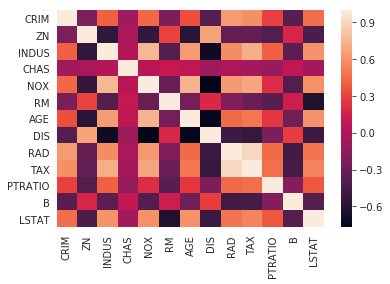

In [5]:
X_df = pd.DataFrame(X_train)
X_df.columns = boston.feature_names
corr = X_df.corr()
print(corr)
sns.heatmap(corr,
         xticklabels=corr.columns,
         yticklabels=corr.columns)



### Define Keras Model

Models in Keras are defined as a sequence of layers.

In [6]:

METRICS = [
      keras.metrics.mean_absolute_error,
      keras.metrics.mean_squared_error,

]

In [7]:
# model = Sequential()
# model.add(Dense(8, activation='relu', input_shape=(len(labels),)))
# model.add(Dense(8, activation='relu'))
# model.add(Dense(1))

#
# model.compile(optimizer='adam', loss='mean_squared_error', metrics=METRICS)
#
#
# model.fit(X_train, y_train, epochs=10, callbacks=[keras.callbacks.EarlyStopping(patience=3)])
#
# # evaluate
# score = model.evaluate(X_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('MAE:', score[1])
# print('MSE:', score[2])

In [8]:
# # save model and architecture to single file
# model.save("model_boston.h5")
# print("Saved model to disk")

### Load model

In [9]:
# load model
model = load_model('model_boston.h5')
# summarize model.
model.summary()
preds = model.predict(X_train)
# mean_preds = np.mean(preds)
# preds = model.predict(X_train) > mean_preds
# preds = preds.astype(int)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 8)                 112       
_________________________________________________________________
dense_11 (Dense)             (None, 8)                 72        
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 9         
Total params: 193
Trainable params: 193
Non-trainable params: 0
_________________________________________________________________


In [10]:
data = []
index = []


n_explanations = X_train.shape[0]

eX_lrp = np.zeros((n_explanations,len(labels)))
eX_ig = np.zeros((n_explanations,len(labels)))


method_attribution_dict = {'ig': ("ig_attributtions_boston.txt", eX_ig),
                                      'lrp': ('lrp_attributions_boston.txt', eX_lrp)}

In [11]:
# # Statistics
# times_lrp = np.ndarray((n_explanations,))
# times_ig = np.ndarray((n_explanations,))
#
# for i in range(n_explanations):
#
#     # input to explain
#     xs = X_train[[i]]
#
#     # For dividing explanations for SpRAy
#     x_class = preds[i]
#
#     # Explanations
#     with DeepExplain(session=K.get_session()) as de:
#
#         # Need to reconstruct the graph in DeepExplain context, using the same weights.
#         # With Keras this is very easy:
#         # 1. Get the input tensor to the original model
#         input_tensor = model.layers[0].input
#
#         # 2. We now target the output of the last dense layer (pre-softmax)
#         # To do so, create a new model sharing the same layers untill the last dense (index -2)
#         fModel = Model(inputs=input_tensor, outputs = model.layers[-1].output)
#         target_tensor = fModel(input_tensor)
#
#         # method 1
#
#         # parameters
#         arg = 100
#
#         # explanations
#         begin = time.time()
#         explanation = de.explain('intgrad', target_tensor, input_tensor, xs, steps=arg)
#         time.sleep(1)
#         end = time.time()
#
#         # records
#         times_ig[i] = end - begin
#         eX_ig[i] = explanation
#
#
#         # method 2
#
#         # parameters
#         arg = 0.0001
#
#         # explanation
#         begin = time.time()
#         explanation = de.explain('elrp', target_tensor, input_tensor, xs, epsilon=arg)
#         time.sleep(1)
#         end = time.time()
#
#         eX_lrp[i] = explanation
#         times_lrp[i] = end - begin
#


Save explanations and report running time

In [12]:
# method_name = 'IG'
# method_dict = {"Mean time": times_ig.mean()}
# data.append(method_dict)
# index.append(method_name)
#
# method_name = 'LRP'
# method_dict = {"Mean time": times_lrp.mean()}
# data.append(method_dict)
# index.append(method_name)
#
# time_table = pd.DataFrame(data, index=index)
# print(time_table)
#
# for (filename, mat) in method_attribution_dict.values():
#     mat = np.matrix(mat)
#     with open(filename,'wb') as f:
#         for line in mat:
#             np.savetxt(f, line, fmt='%.2f')
#





### Load explanations

Besides explanations made by LRP and IG, we load explanations of LIME computed in other notebook.

In [13]:
method_attribution_dict = {'ig': ("ig_attributtions_boston.txt", 0),
                            'lrp': ('lrp_attributions_boston.txt', 0),
                            'lime': ('lime_attributtions_boston.txt', 0)}


In [14]:
for method, (filename, mat) in method_attribution_dict.items():
    # Read attribution matrix of method
    mat = np.loadtxt(filename, dtype=float)
    print(filename + " dims = ", mat.shape)
    method_attribution_dict[method] = (filename, mat)

lrp_attributions_boston.txt dims =  (455, 13)
ig_attributtions_boston.txt dims =  (455, 13)
lime_attributtions_boston.txt dims =  (455, 13)


Show some examples of explanations

In [15]:

sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5,
                rc={"lines.linewidth": 2.5})

colors = np.array(sns.color_palette("hls", len(labels)))


Observe that the explications for some inputs (like for i=0 between lrp and ig) have very different attributtions across methods,
however, they're very similar in other cases (e.g., i=1 for between lrp and ig).

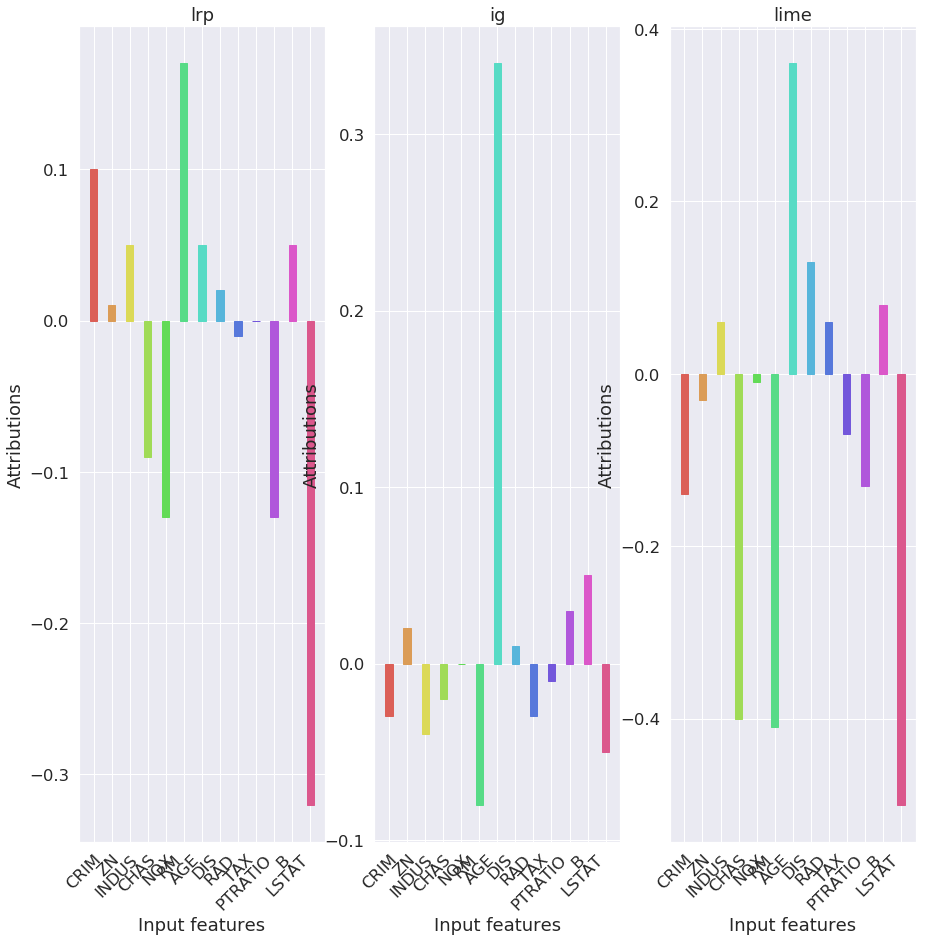

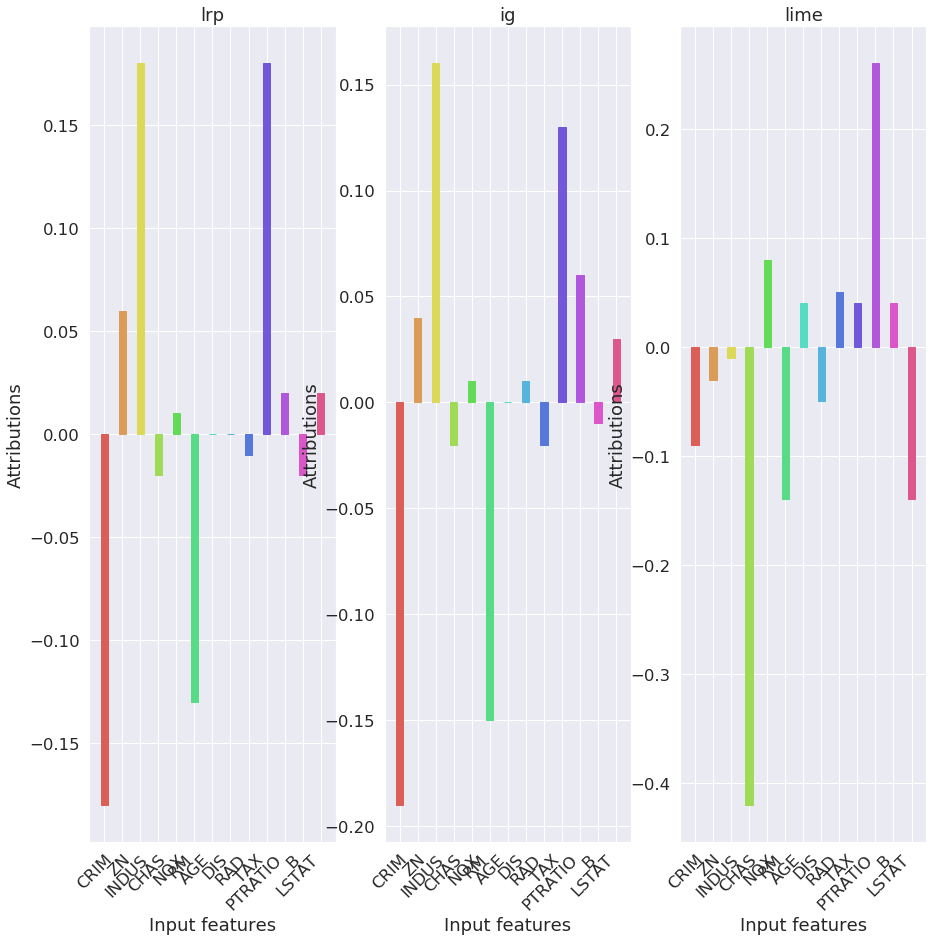

In [16]:
for i in [0,1]:

    fig     = plt.figure(figsize = (15, 15))
    rows    = 1
    columns = len(method_attribution_dict)

    k = 1
    for method, (filename, mat) in method_attribution_dict.items():
        ax1 = fig.add_subplot(rows, columns, k)
        k += 1
        ax1.set_title(method)
        ax1.set_xlabel("Input features")
        ax1.set_ylabel("Attributions")
        plt.setp(ax1.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
        barlist = plt.bar(labels, mat[i].reshape(-1,), color ='black', width = 0.4)
        for j in range(len(labels)):
            barlist[j].set_color(colors[j])

    plt.show()



### Spectral relevance analysis (SpRAy)

Normalize explanations


In [17]:
for method, (filename, mat) in method_attribution_dict.items():
    # Normalize attributions
    mat_norm = preprocessing.StandardScaler().fit_transform(mat)
    method_attribution_dict[method] = (filename, mat_norm)


Selection of number of clusters by elbow criteria.



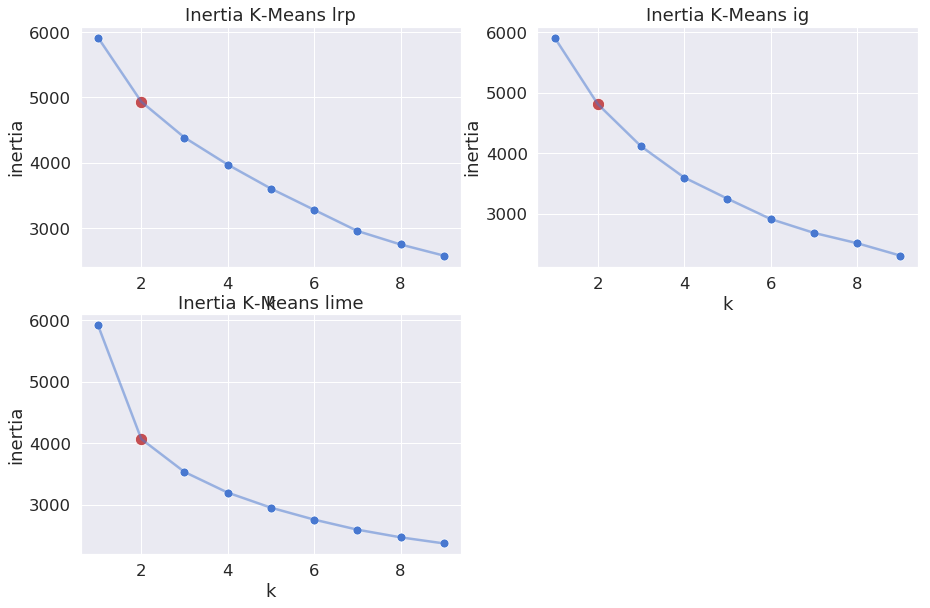

In [18]:
method_elbow_dict = dict()
method_elbow_dict['ig'] = 2
method_elbow_dict['lrp'] = 2
method_elbow_dict['lime'] = 2



fig     = plt.figure(figsize = (15, 15))
rows    = len(method_attribution_dict)
columns = 2
i = 0

for method, (filename, mat) in method_attribution_dict.items():

    # Calcule number of clusters using k-means

    inertias = []

    k_candidates = range(1, 10)

    for k in k_candidates:
        k_means = KMeans(random_state=42, n_clusters=k)
        k_means.fit(mat)
        inertias.append(k_means.inertia_)

    ax = fig.add_subplot(rows, columns, i+1)

    sns.scatterplot(x=k_candidates, y = inertias, s=80, ax=ax)
    e = method_elbow_dict[method] - 1
    sns.scatterplot(x=[k_candidates[e]], y = [inertias[e]], color=sns_c[3], s=150, ax=ax)
    sns.lineplot(x=k_candidates, y = inertias, alpha=0.5, ax=ax)

    ax.set(title='Inertia K-Means '+method, ylabel='inertia', xlabel='k')

    i += 1


### Visualization of explanations (PCA + k-means)

All the scatterplots show PCA projections of explanations onto firts two principal components.
The explanations in a scatterplot correspond only to one method: ig or lrp.


Scatterplots at left are colored by their true value; more intense higher the price. Scatterplots at right are colored
by k-means cluster.

Barplots below are examples of explanations grouped by cluster.


In [19]:

# Utility function to visualize the outputs with t-SNE or PCA

# In order to visualize the results of clustering algorithms, fashion_scatter()
# function takes two arguments: 1. x, which is a 2-D numpy array containing the output of the
# algorithm and 2. colors, which is 1-D numpy array containing the labels of the dataset. The function
# will render a scatter plot with as many unique colors as the number of classes in the variable colors.

# Utility function to visualize the outputs of PCA and t-SNE

def fashion_scatter(x, colors, method):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(6, 6))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int)])
    plt.title(method)

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.
        xmed, ymed = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xmed, ymed, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

def get_pca_proj(mat):
    """Return PCA projection and prints a report of de explained variance"""
    pca = PCA(n_components=4)
    pca_result = pca.fit_transform(mat)
    pca_df = pd.DataFrame(columns = ['pca1','pca2','pca3','pca4'])

    pca_df['pca1'] = pca_result[:,0]
    pca_df['pca2'] = pca_result[:,1]
    pca_df['pca3'] = pca_result[:,2]
    pca_df['pca4'] = pca_result[:,3]

    print('Variance explained per principal component: {}'.format(pca.explained_variance_ratio_))

    top_two_comp = pca_df[['pca1','pca2']]

    return top_two_comp.values

def cluster_by_kmeans(mat, n_clusters):
    # Clustering
    data_df = pd.DataFrame(mat)
    k_means = KMeans(random_state=RANDOM_SEED, n_clusters=n_clusters)
    k_means.fit(data_df)
    clusters = np.array(k_means.predict(data_df))
    return clusters

In [20]:
def add_continuous_colored_scatter_plot_to_fig(x, y, colors, rows, columns, n_sub_fig, fig, title):
    ax = fig.add_subplot(rows, columns, n_sub_fig)
    ax.set_title(title)

    cmap = sns.cubehelix_palette(as_cmap=True)
    points = ax.scatter(x, y, c=colors, s=80, cmap=cmap)
    fig.colorbar(points, ax=ax)

def add_colored_scatter_plot_to_fig(x, y, colors, rows, columns, n_sub_fig, fig, title):
    ax = fig.add_subplot(rows, columns, n_sub_fig)
    ax.set_title(title)
    sns.scatterplot(x=x, y = y, c=colors, s=80, ax=ax)

def clusters_to_colors(clusters):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(clusters))
    palette = np.array(sns.color_palette("hls", num_classes))
    return palette[clusters.astype(np.int)]

bar_colors = np.array(sns.color_palette("hls", len(labels)))

In [21]:
from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage,
                                  AnnotationBbox)


In [22]:
def visualize_some_explanations_by_cluster(method_class, exp, clusters):
    """ for each method -restricted to one prediction class-
    and for each cluster in that method-prediction-class
    a sample of explanations are presented """
    colors = clusters_to_colors(clusters)
    filenames = []
    for i in range(len(np.unique(clusters))):

        # get explanations in cluster of interest
        idx_interest = np.where(clusters==i)[0]
        explanations_in_cluster = exp[idx_interest,:]
        colors_of_interest = colors[idx_interest]

        # select number of explanations to visualize
        n_exp_clus = explanations_in_cluster.shape[0]
        n_explanations = min(n_exp_clus, 10)

        # select sample of explanations to visualize
        idx_interest = np.random.choice(n_exp_clus, n_explanations, replace=False)
        explanations_to_visualize = explanations_in_cluster[idx_interest,:]
        colors_to_visualize = colors_of_interest[idx_interest]

        # Visualization
        rows = n_explanations/2 + 1
        columns = 2
        fig  = plt.figure(figsize = (20, 20))
        title_obj = plt.title(method_class+": examples of explanations in cluster "+str(i))
        plt.setp(title_obj, color=colors_to_visualize[0])

        for j in range(n_explanations):
            ax1 = fig.add_subplot(rows, columns, j+1)
            plt.setp(ax1.get_xticklabels(), rotation=15, ha="right",
                 rotation_mode="anchor", fontsize=10)
            barlist = plt.bar(labels, explanations_to_visualize[j].reshape(-1,), color ='black', width = 0.4)
            for k in range(len(labels)):
                barlist[k].set_color(bar_colors[k])
        filenames += ['cluster_'+str(i)+'.png']
        plt.savefig(filenames[i], bbox_inches='tight', pad_inches=0)
        ax1.set_xlabel("Input features")
        ax1.set_ylabel("Attributions")
    plt.show()

    return filenames

def medians_in_projected_clusters(proy, clusters):
    medians = []
    num_classes = len(np.unique(clusters))

    # Position of each label at median of data points.
    for i in range(num_classes):
        med = np.median(proy[clusters == i, :], axis=0)
        medians += [med]

    return medians

In [23]:
from PIL import Image

Variance explained per principal component: [0.24736814 0.15646696 0.12031767 0.10214842]


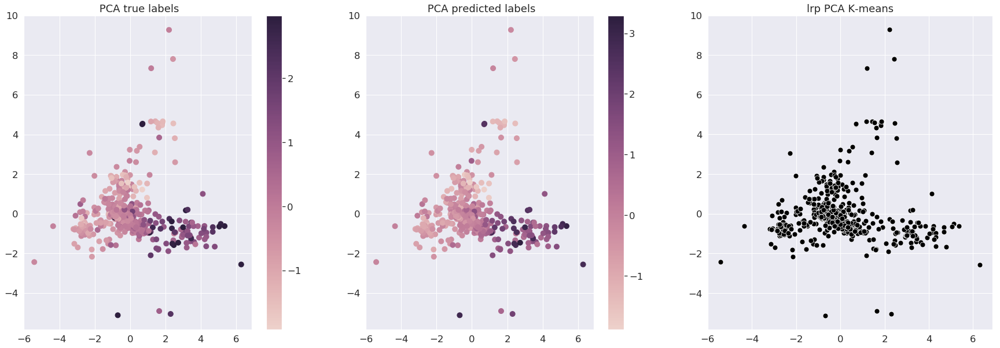

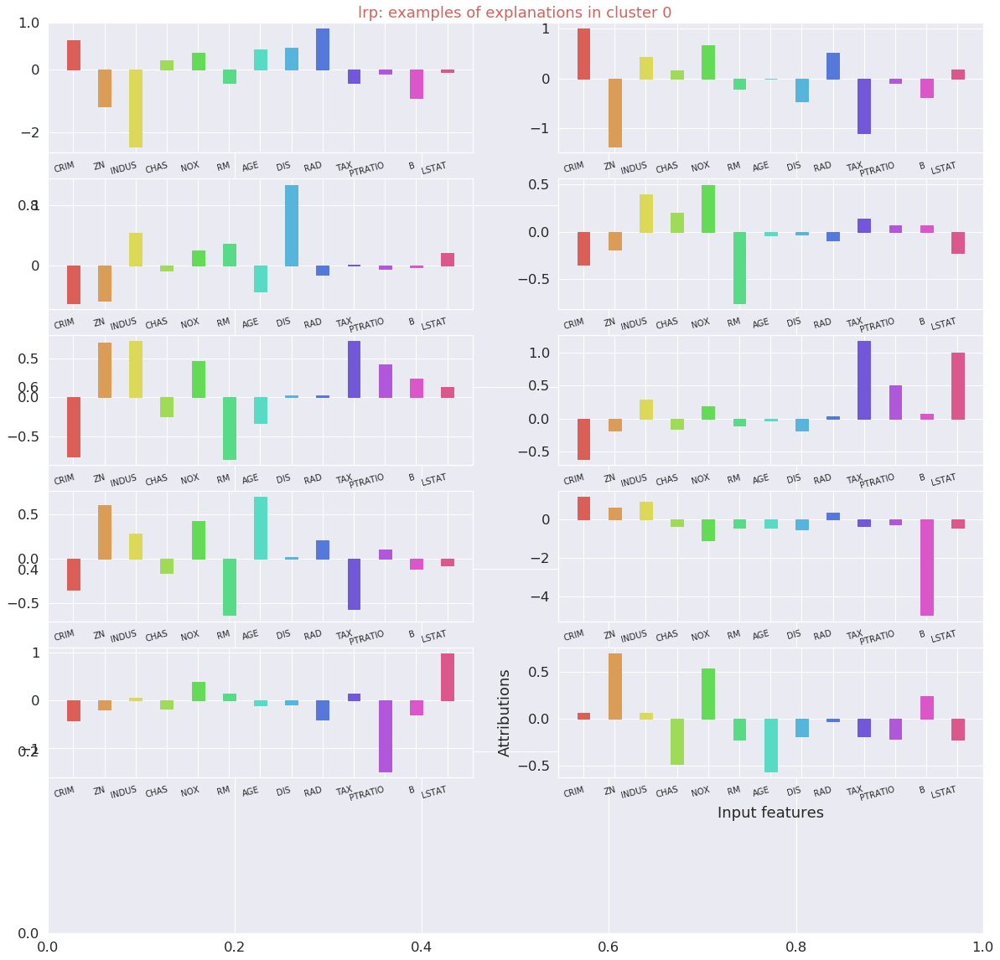

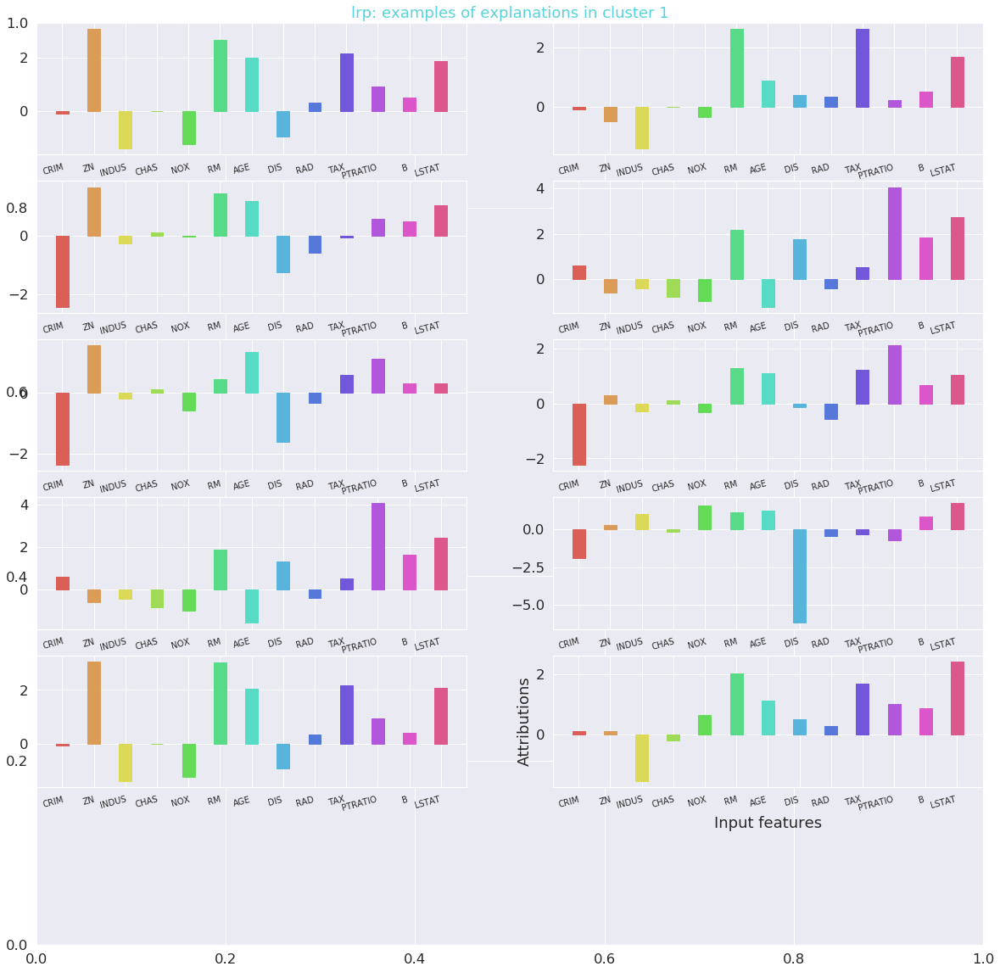

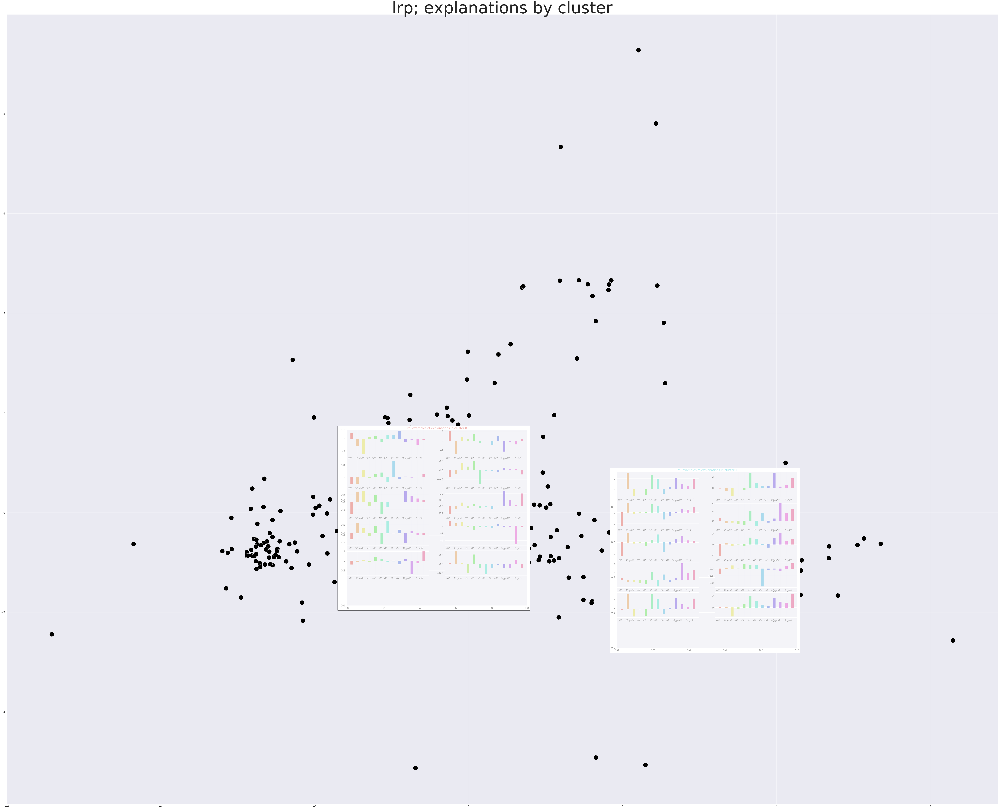

Variance explained per principal component: [0.26257849 0.17527541 0.13523234 0.0996406 ]


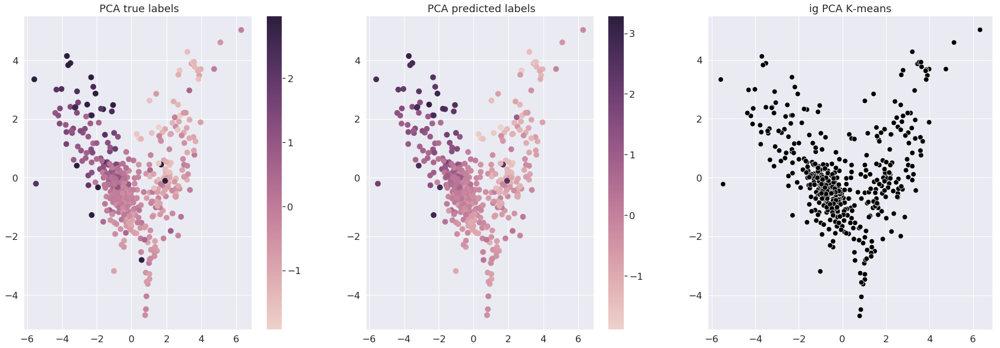

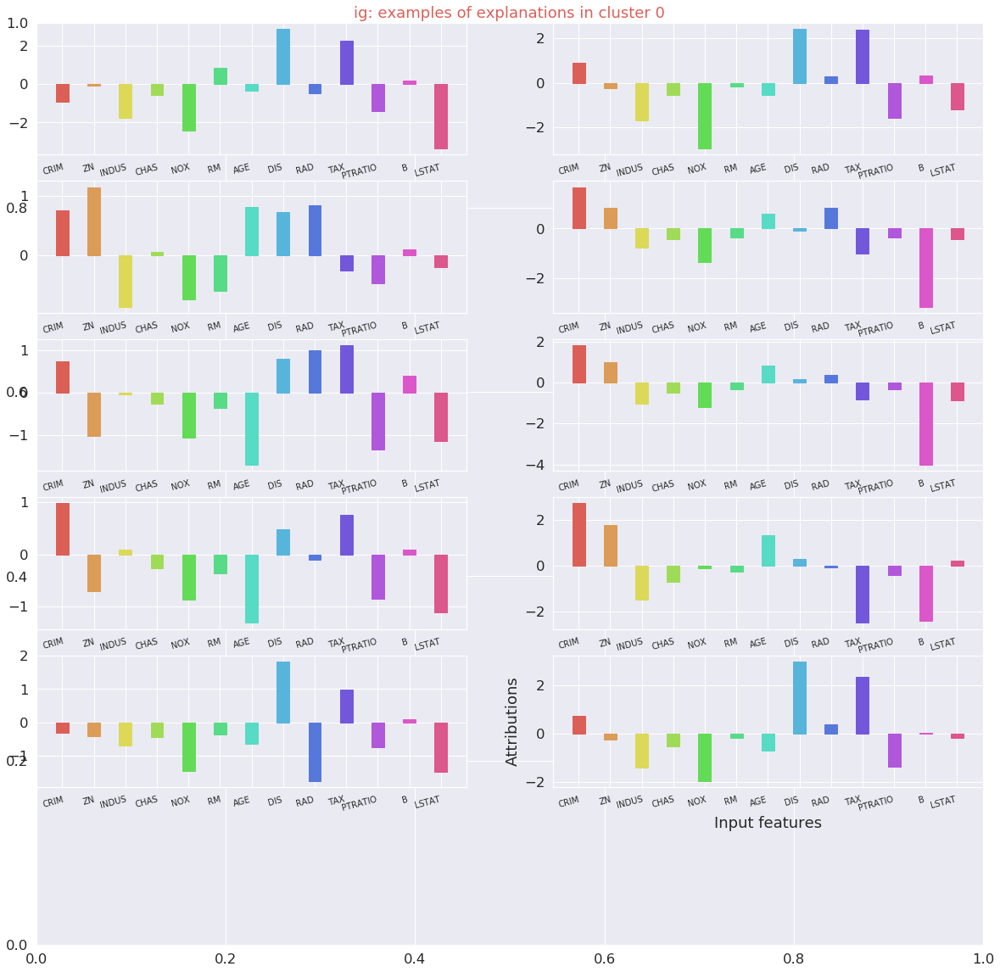

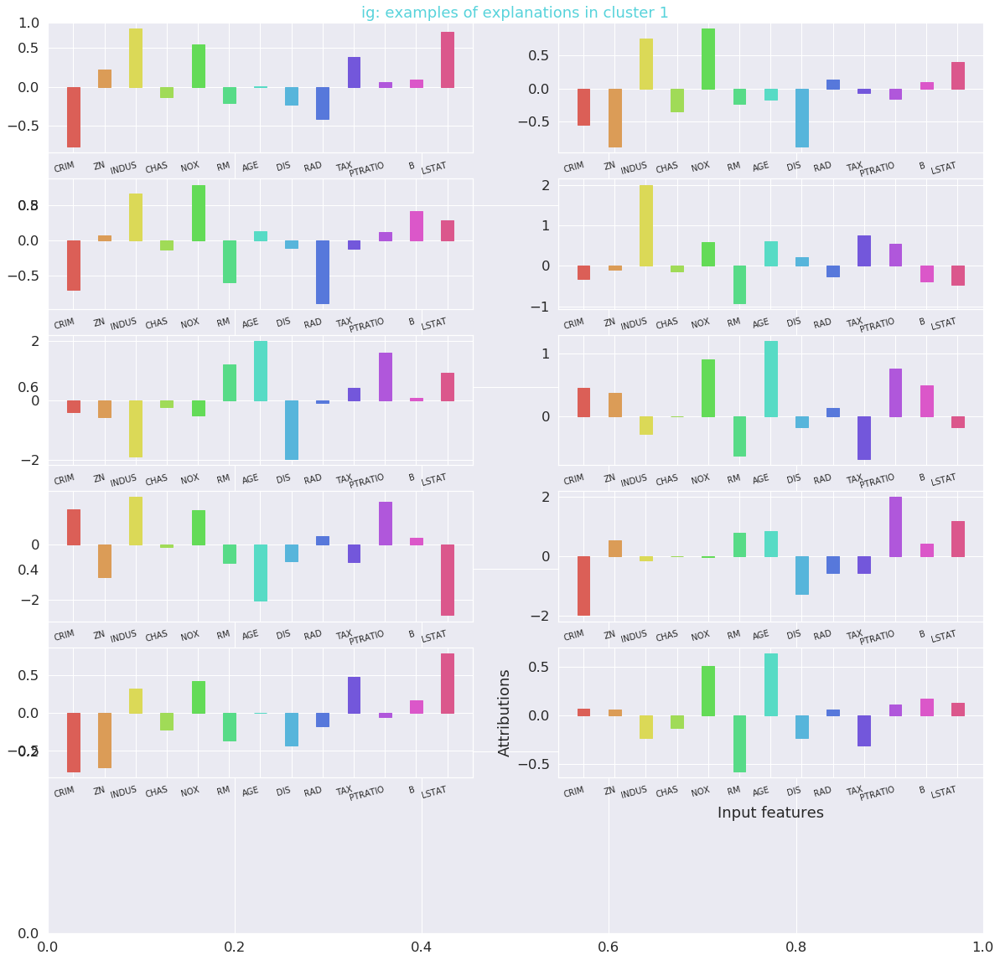

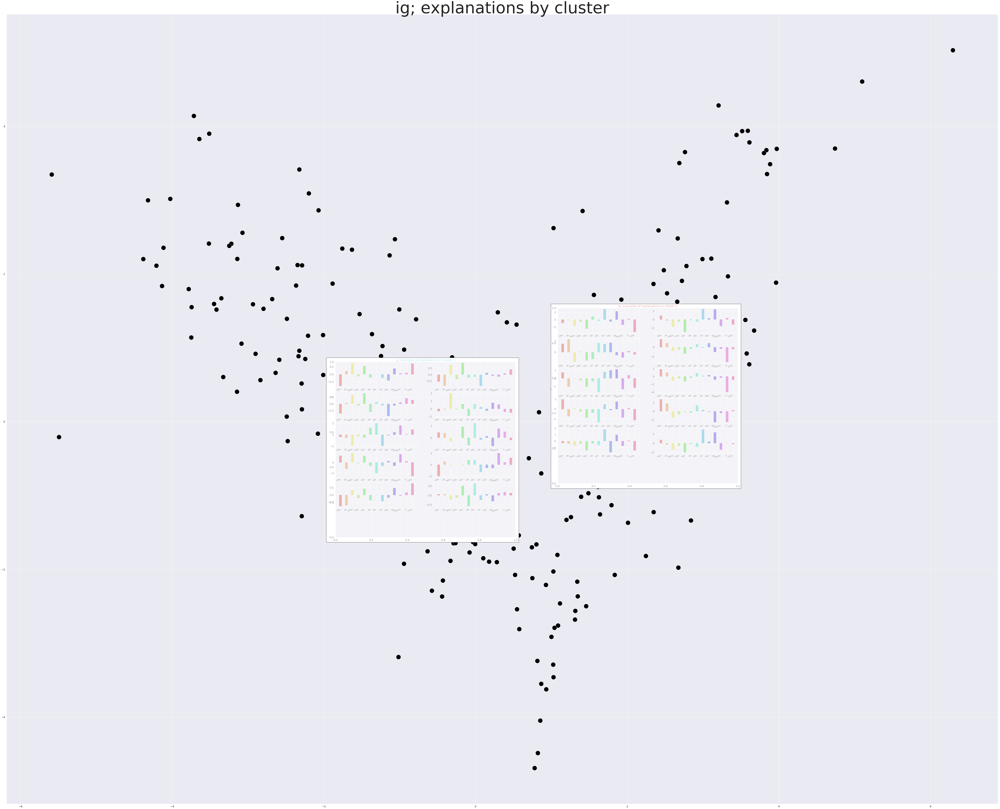

Variance explained per principal component: [0.40081462 0.10794333 0.09540449 0.0694085 ]


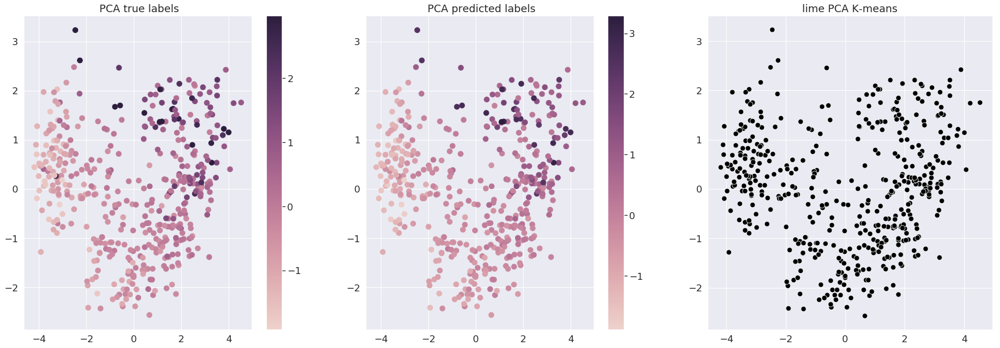

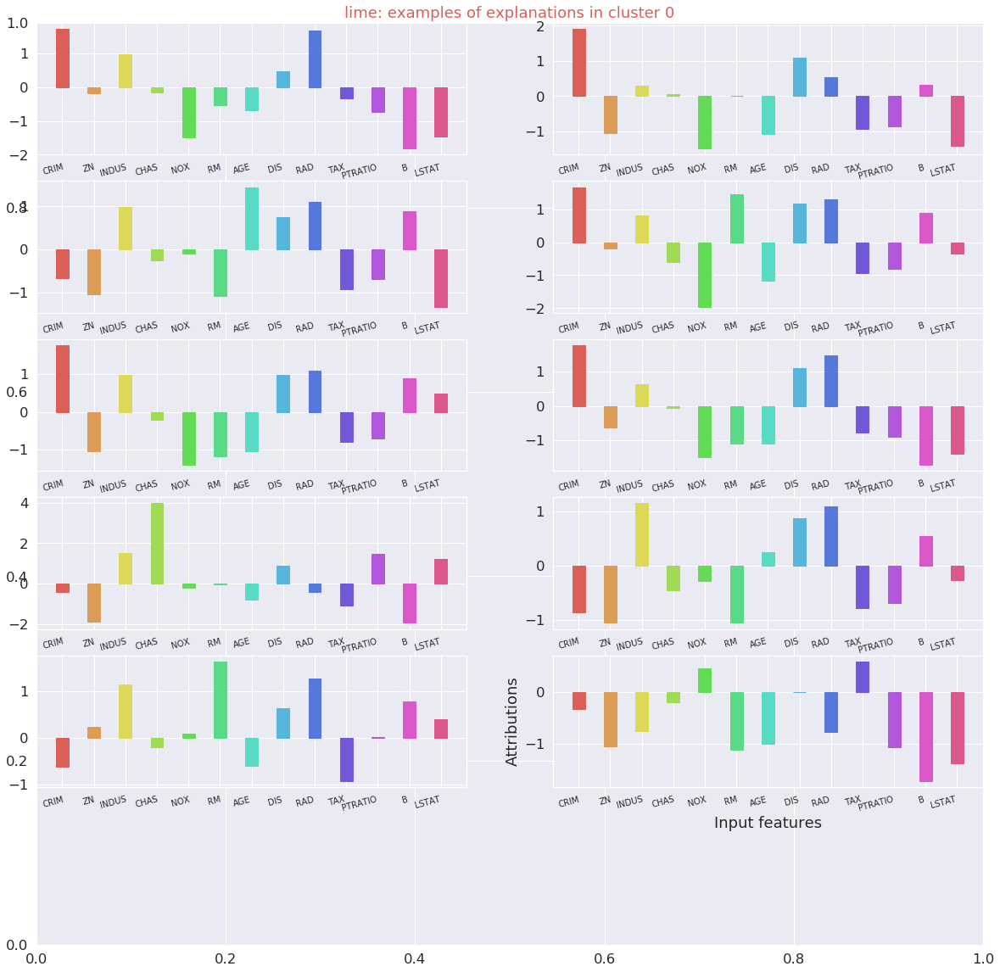

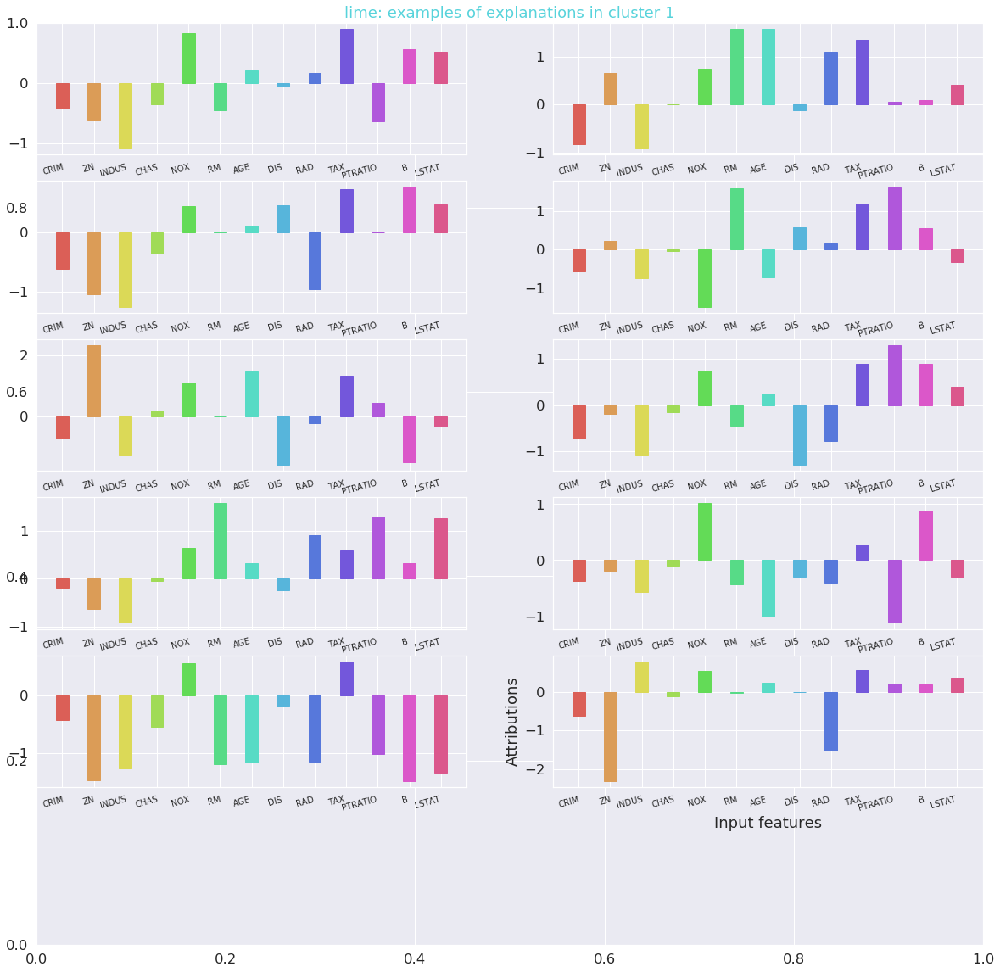

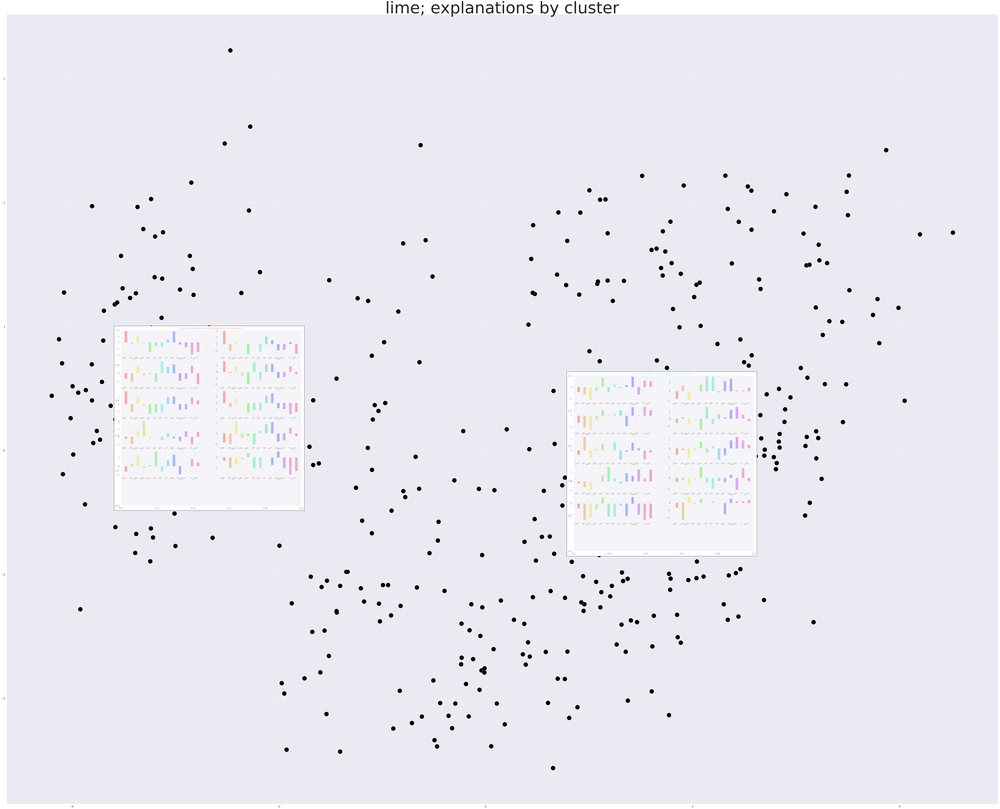

In [24]:
for method, (filename, mat) in method_attribution_dict.items():

    rows = 1
    columns = 3
    fig  = plt.figure(figsize = (30, 10))

    proy = get_pca_proj(mat)

    colors = y_train.reshape(-1,)


    add_continuous_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 1, fig,
                                    " PCA true labels")

    colors = preds.reshape(-1,)


    add_continuous_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 2, fig,
                                    " PCA predicted labels")
    # Clustering
    clusters = cluster_by_kmeans(mat, method_elbow_dict[method])

    # Clustering visualization
    colors = clusters_to_colors(clusters)
    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 3, fig,
                                    method+" PCA K-means")

    explanation_filenames = visualize_some_explanations_by_cluster(method, mat, clusters)

    cluster_medians = medians_in_projected_clusters(proy, clusters)
    # explanations over scatter
    fig, ax = plt.subplots(figsize=(110, 90))
    ax.set_title(method+"; explanations by cluster", fontsize=100)
    sns.scatterplot(proy[:,0], proy[:,1], c=colors, s=800, ax=ax)

    # ax.title("PCA predicted labels")
    for n_im, expl_filename in enumerate(explanation_filenames):
        img = Image.open(expl_filename)
        img.putalpha(127)  # Half alpha; alpha argument must be an int
        img.save("t_"+expl_filename)
        arr = mpl.pyplot.imread("t_"+expl_filename)
        im = OffsetImage(arr, zoom=1)
        im.image.axes = ax
        ab = AnnotationBbox(im, cluster_medians[n_im])
        ax.add_artist(ab)
        plt.draw()
    plt.show()



#### SpRAy with Spectral Clustering (SC)

In [25]:
def generate_graph_laplacian(df, nn):
    """Generate graph Laplacian from data."""
    # Adjacency Matrix.
    connectivity = kneighbors_graph(X=df, n_neighbors=nn, mode='connectivity')
    adjacency_matrix_s = (1/2)*(connectivity + connectivity.T)
    # Graph Laplacian.
    graph_laplacian_s = sparse.csgraph.laplacian(csgraph=adjacency_matrix_s, normed=False)
    graph_laplacian = graph_laplacian_s.toarray()
    return graph_laplacian

def compute_spectrum_graph_laplacian(graph_laplacian):
    """Compute eigenvalues and eigenvectors and project
    them onto the real numbers.
    """
    eigenvals, eigenvcts = linalg.eig(graph_laplacian)

    # Verify eigenvalues are real
    print("Imaginary values ", np.unique(np.imag(eigenvals)))

    eigenvals = np.real(eigenvals)
    eigenvcts = np.real(eigenvcts)
    return eigenvals, eigenvcts

def project_and_transpose(eigenvals, eigenvcts, num_ev):
    """Select the eigenvectors corresponding to the first
    (sorted) num_ev eigenvalues as columns in a data frame.
    """
    eigenvals_sorted_indices = np.argsort(eigenvals)
    indices = eigenvals_sorted_indices[: num_ev]

    proj_df = pd.DataFrame(eigenvcts[:, indices.squeeze()])
    proj_df.columns = ['v_' + str(c) for c in proj_df.columns]
    return proj_df

def run_k_means(df, n_clusters):
    """K-means clustering."""
    k_means = KMeans(random_state=25, n_clusters=n_clusters)
    k_means.fit(df)
    cluster = k_means.predict(df)
    return cluster


def clusters_by_spectral_clustering(mat, n_neighbors, n_clusters):
    """Spectral Clustering Algorithm."""
    df = pd.DataFrame(mat)
    graph_laplacian = generate_graph_laplacian(df, n_neighbors)
    eigenvals, eigenvcts = compute_spectrum_graph_laplacian(graph_laplacian)
    proj_df = project_and_transpose(eigenvals, eigenvcts, n_clusters)
    cluster = run_k_means(proj_df, proj_df.columns.size)

    return np.array(cluster)

First, we decide perplexity for T-SNE in each set of explanations (associated to LRP, LIME or IG and one predicted class),
and the number of clusters for Spectral Clustering.


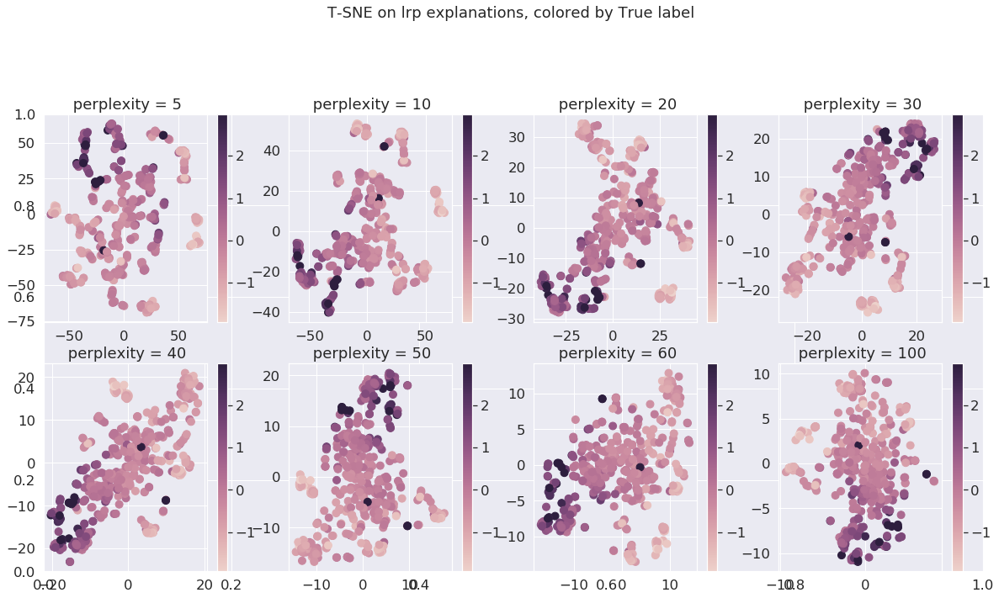

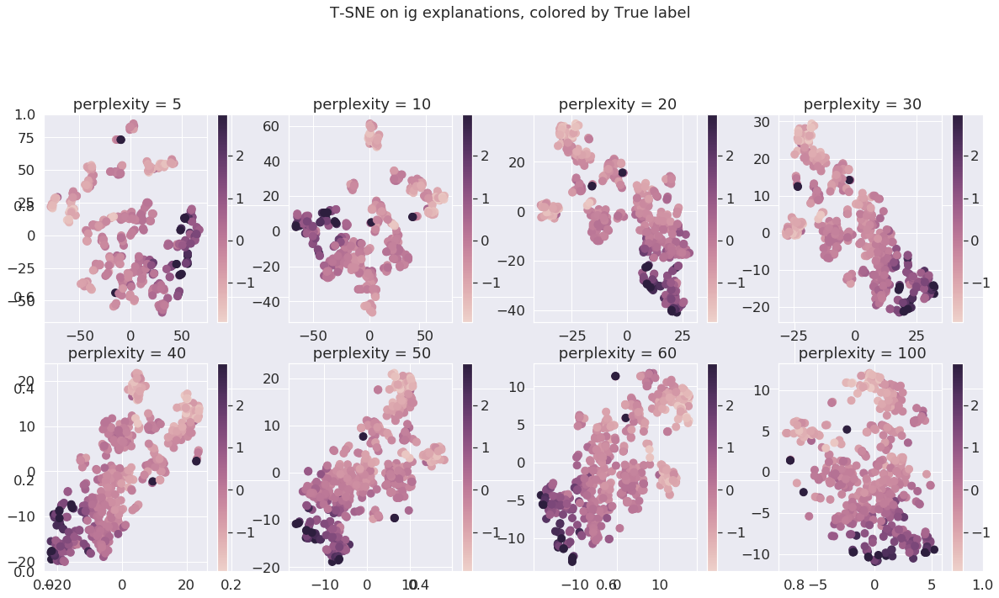

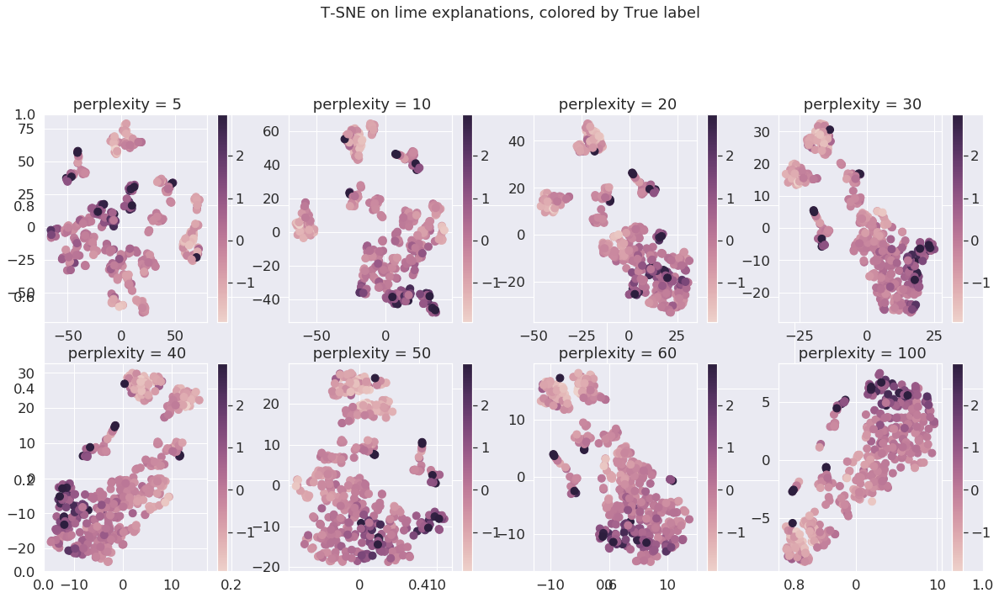

In [26]:

for method, (filename, mat) in method_attribution_dict.items():

    perplexitys = [5, 10, 20, 30, 40, 50, 60, 100]
    rows = 2
    columns = (len(perplexitys)+1)/2
    fig  = plt.figure(figsize = (20, 10))

    colors = y_train.reshape(-1,)

    plt.title("T-SNE on "+str(method)+" explanations, colored by True label ", y=1.2)
    for k, perplexity in enumerate(perplexitys):
        proy = TSNE(random_state=RANDOM_SEED, perplexity=perplexity).fit_transform(mat)
        add_continuous_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, k+1, fig,
                                    " perplexity = "+str(perplexity))



In [27]:
method_class_perplexitys_clusters_dict = dict()

method_class_perplexitys_clusters_dict['ig'] = (50, 4)
method_class_perplexitys_clusters_dict['lrp'] = (40, 4)
method_class_perplexitys_clusters_dict['lime'] = (40, 4)





method_proy_attribution_labels = dict()
for method, (filename, mat) in method_attribution_dict.items():

    perplexity = method_class_perplexitys_clusters_dict[method][0]

    proy = TSNE(random_state=RANDOM_SEED, perplexity=perplexity).fit_transform(mat)


    method_proy_attribution_labels[method] = (proy, mat, y_train.reshape(-1,))

Election of number of neighbours for Laplacian graph.

Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]
Imaginary values  [0.]


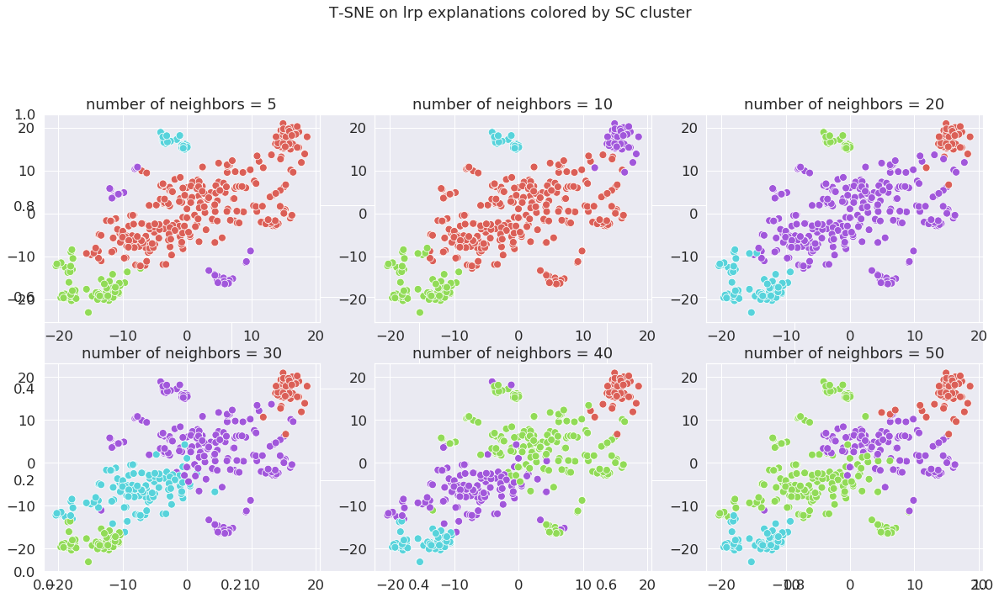

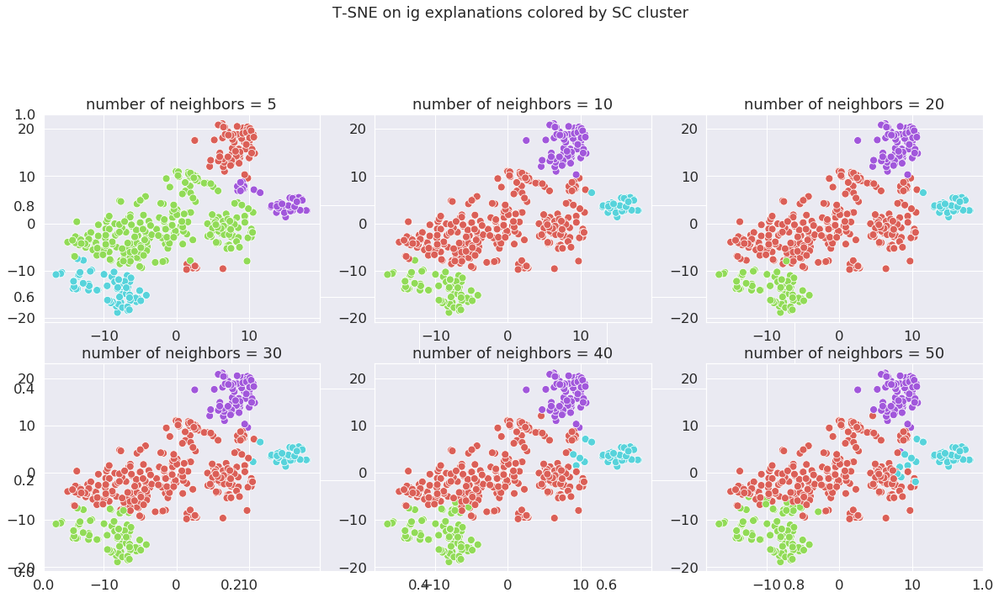

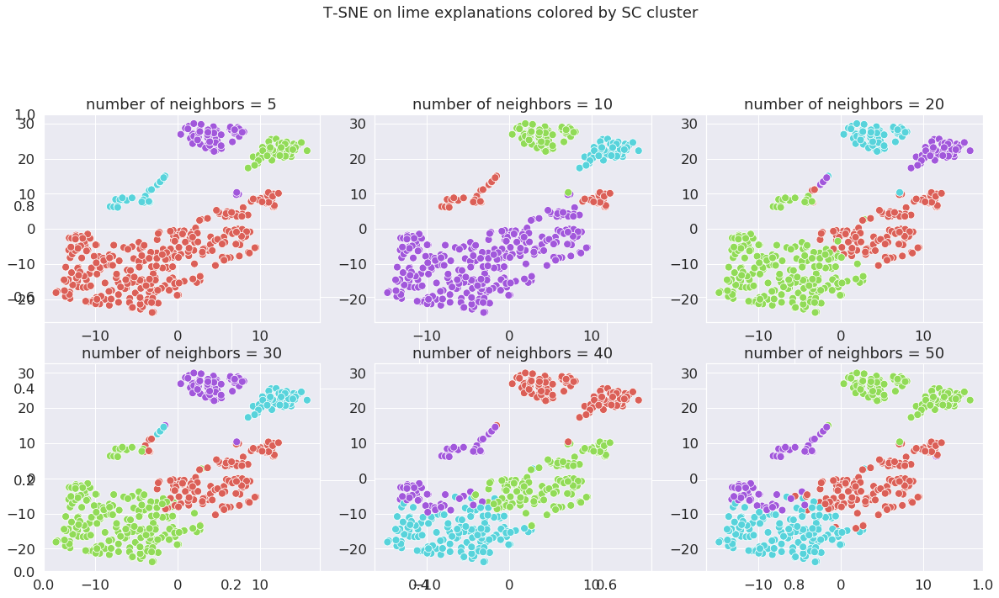

In [28]:
for method, (proy, mat, real_labels) in method_proy_attribution_labels.items():

    neighbors_opt = [5, 10, 20, 30, 40, 50]
    rows = 2
    columns = (len(neighbors_opt)+1)/2
    fig  = plt.figure(figsize = (20, 10))
    plt.title("T-SNE on "+str(method)+" explanations colored by SC cluster ", y=1.2)

    # Clustering
    n_clusters = method_class_perplexitys_clusters_dict[method][1]

    # Clustering visualization
    for k, n_neighbors in enumerate(neighbors_opt):
        clusters = clusters_by_spectral_clustering(mat, n_neighbors, n_clusters)
        colors = clusters_to_colors(clusters)
        add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, k+1, fig,
                                        "number of neighbors = "+str(n_neighbors))

In [29]:
method_class_nneighbors = dict()

method_class_nneighbors['lrp'] = 20

method_class_nneighbors['ig'] = 20

method_class_nneighbors['lime'] = 10





### Visualization of explanations (t-SNE + SC)



Imaginary values  [0.]


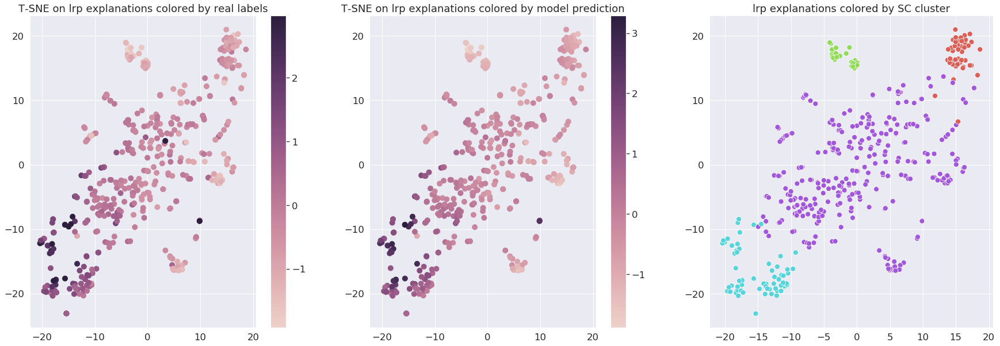

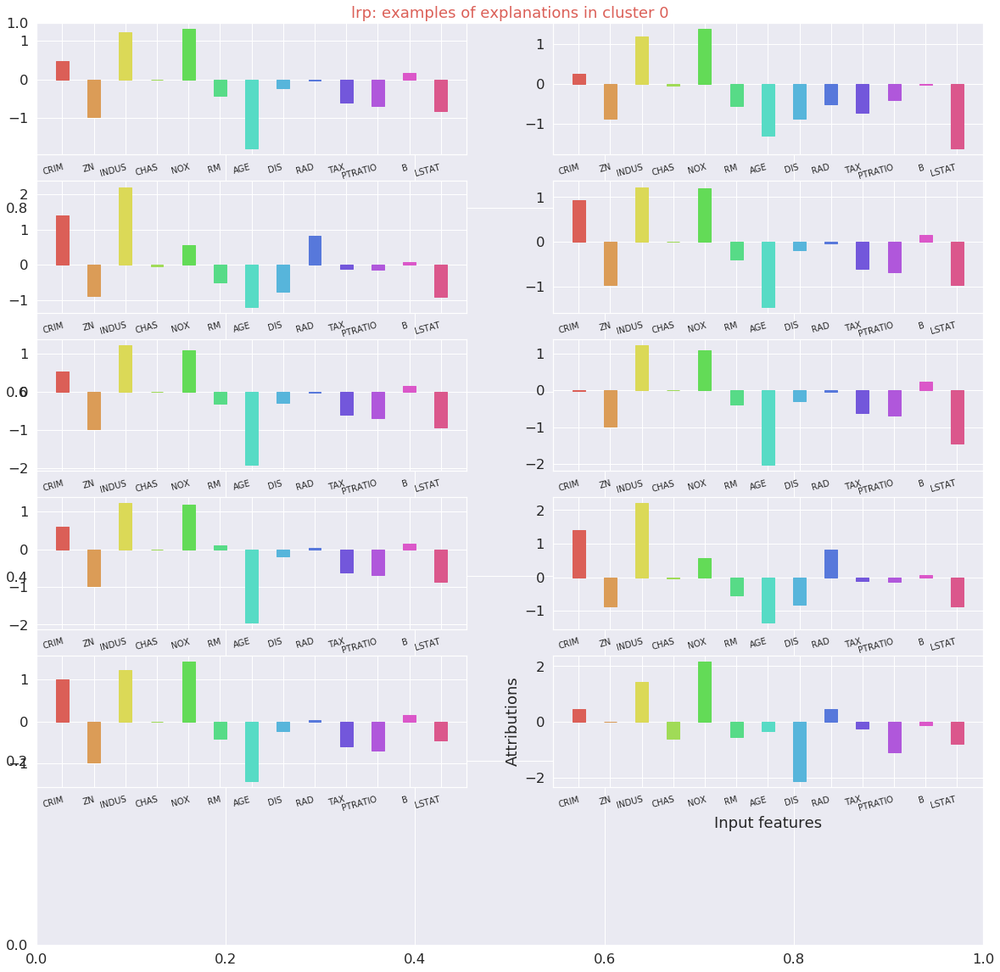

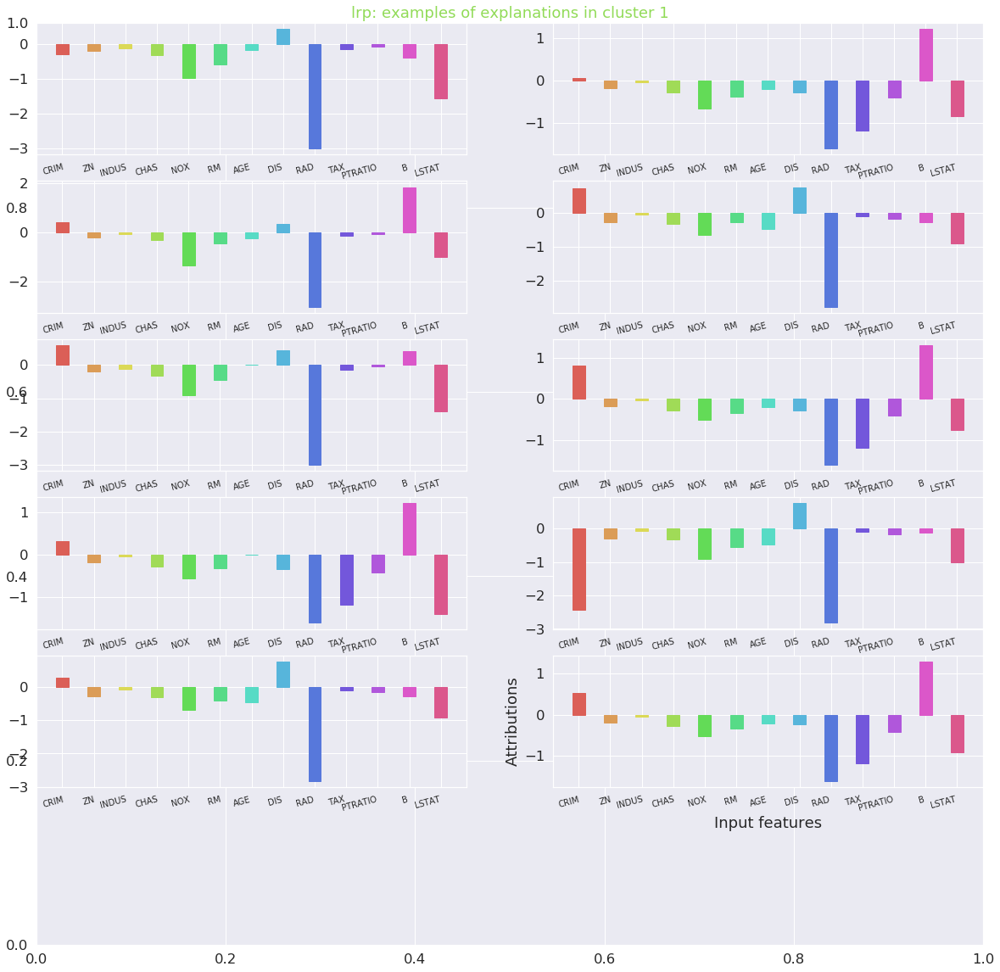

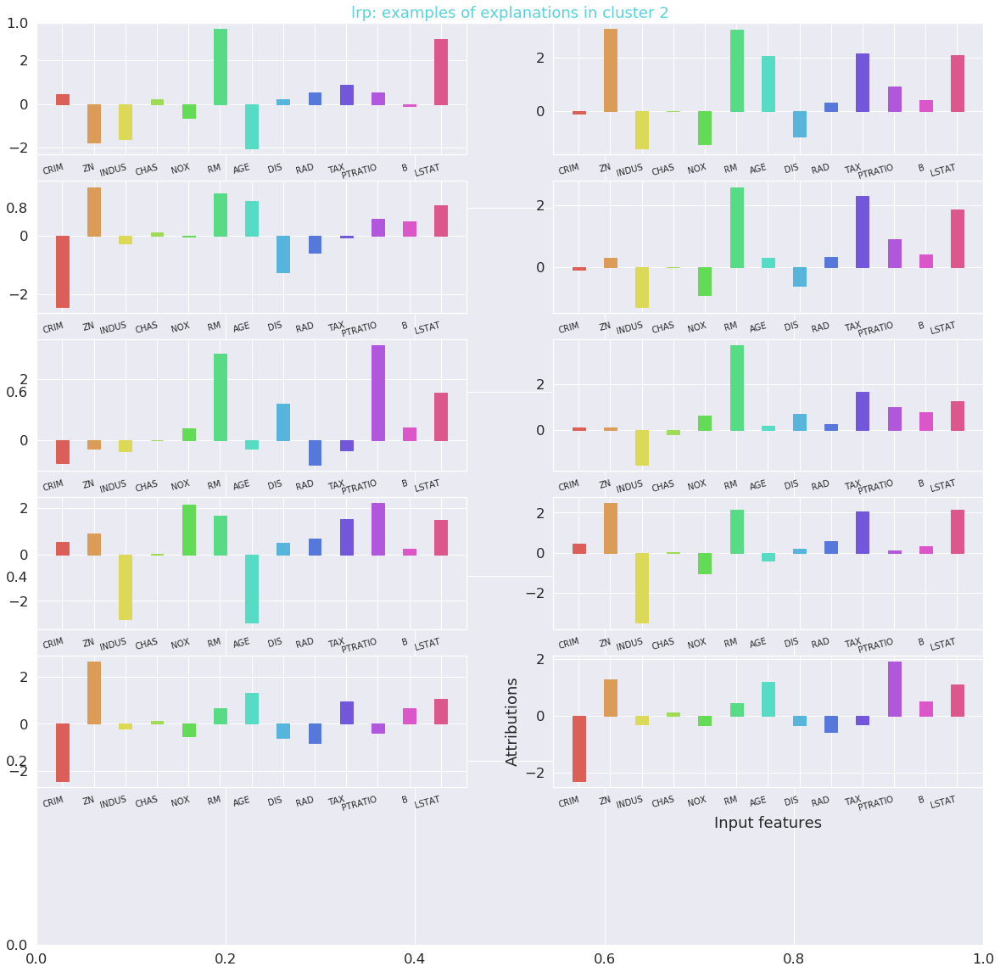

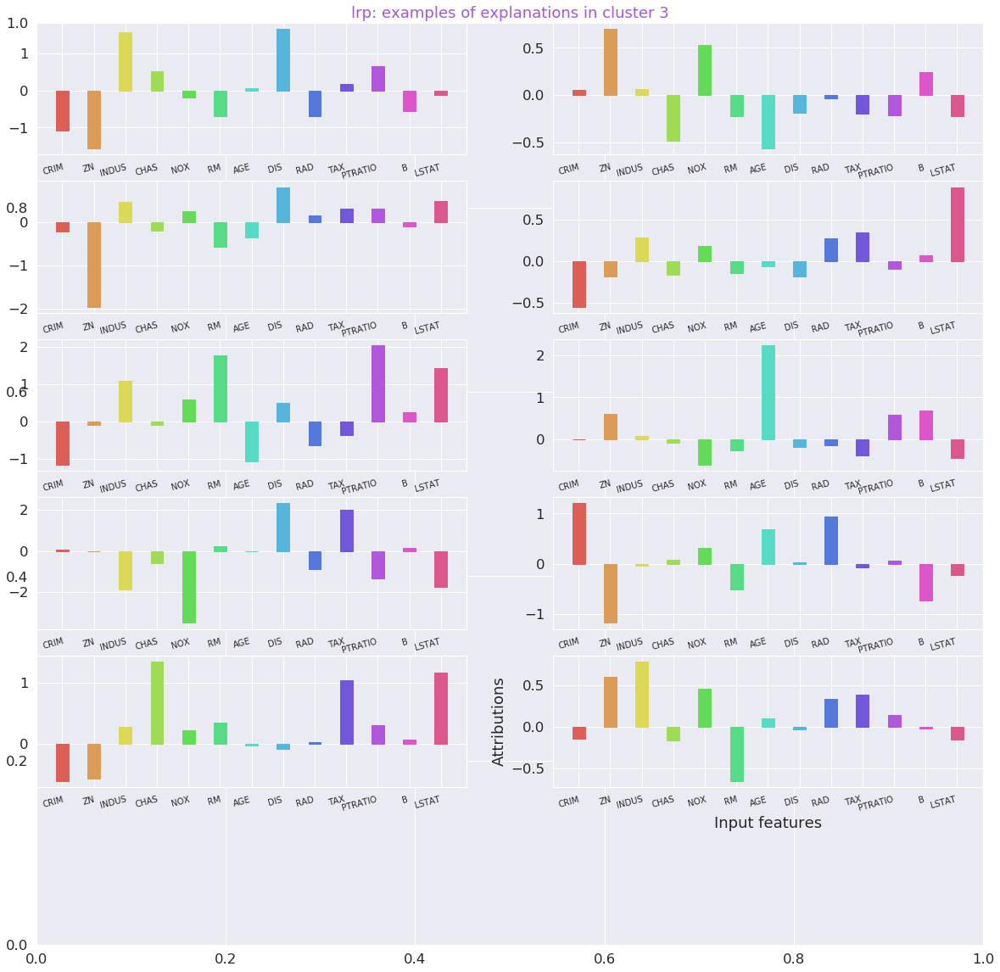

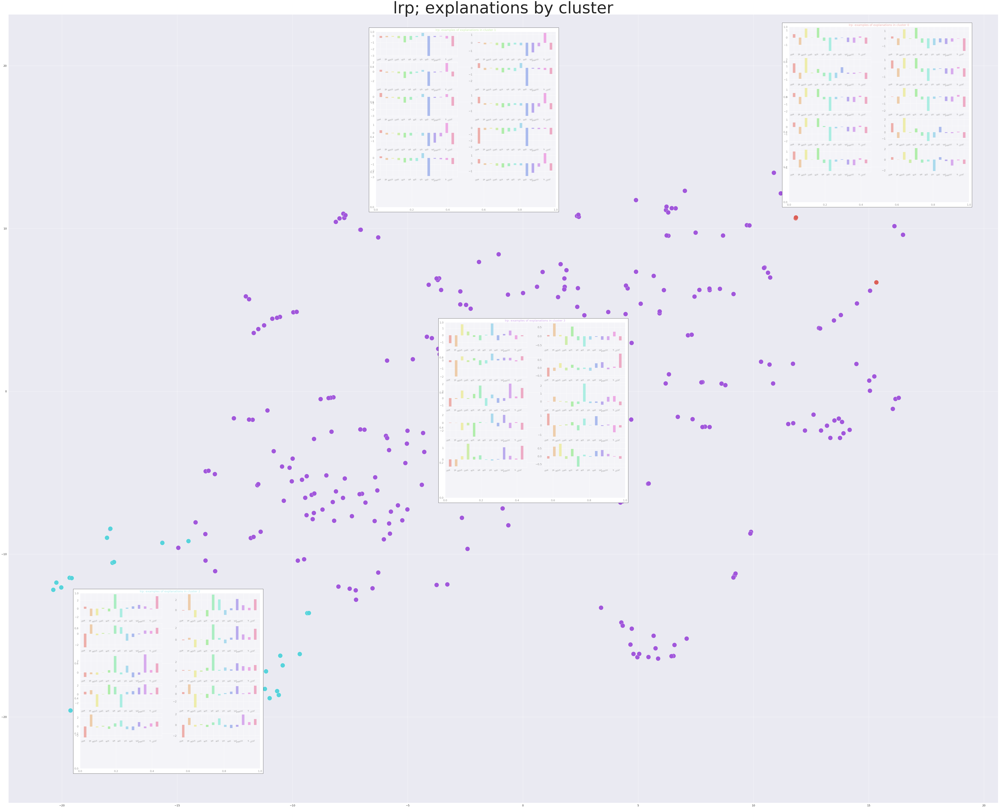

Imaginary values  [0.]


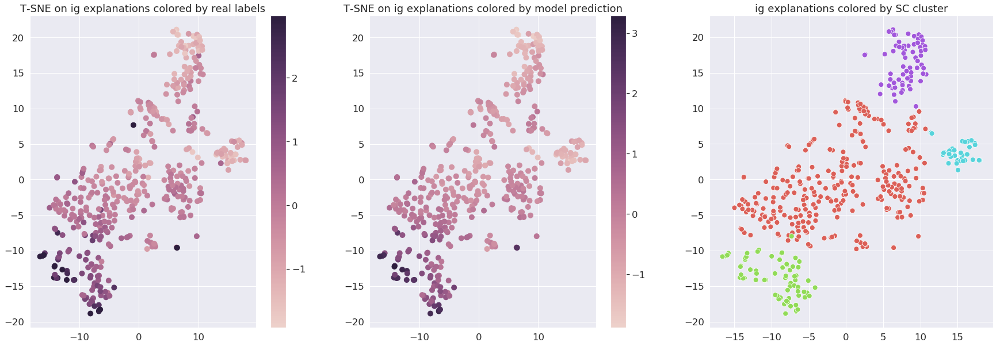

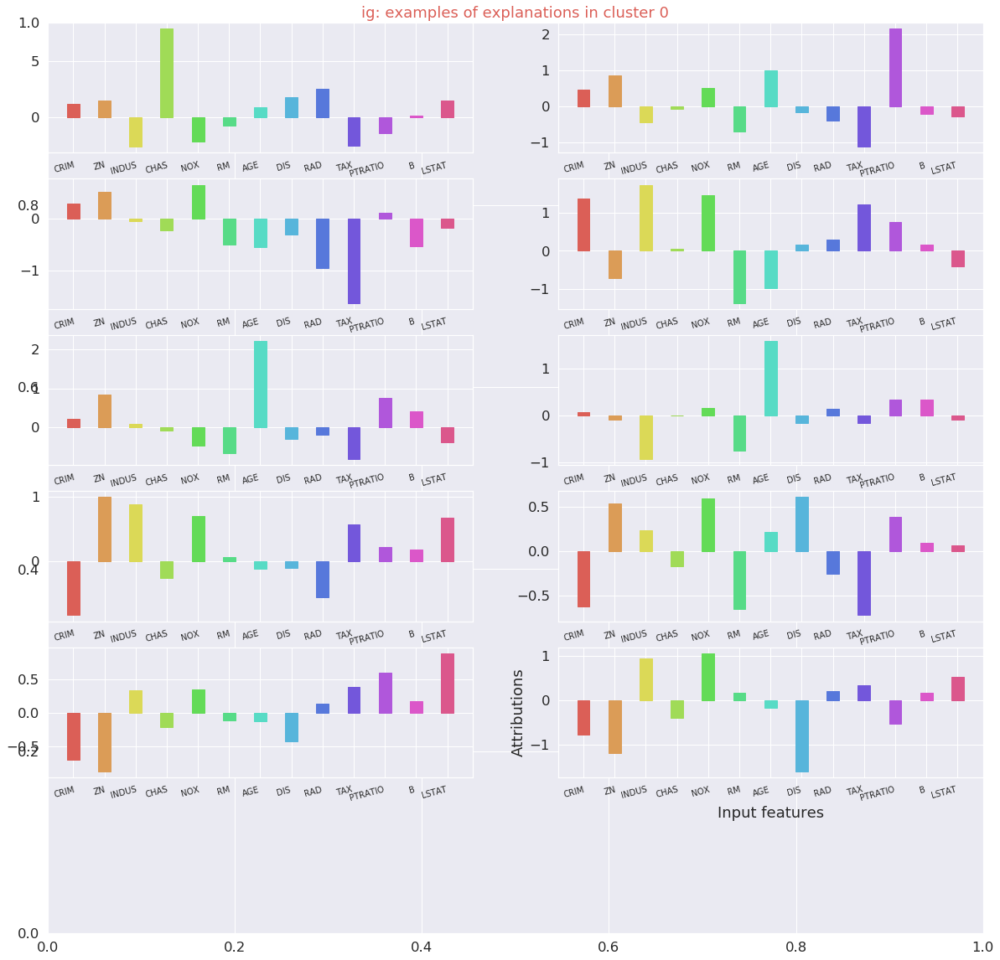

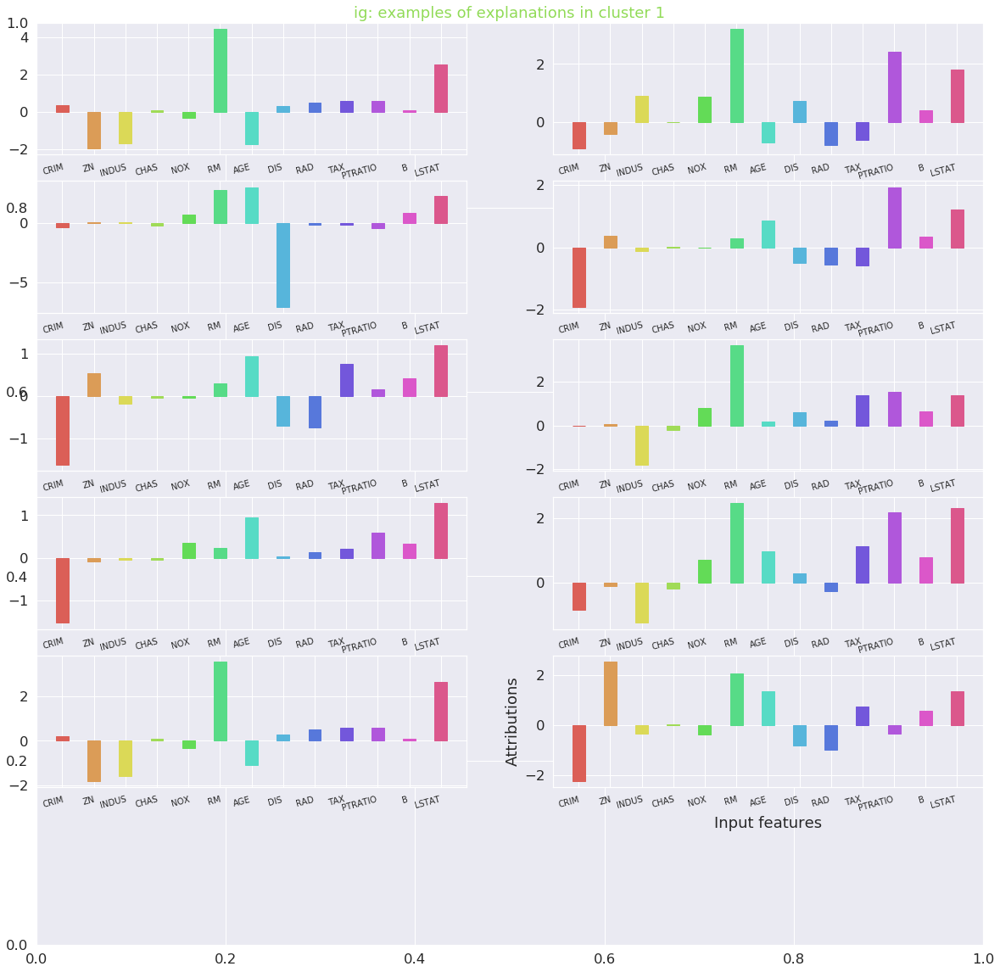

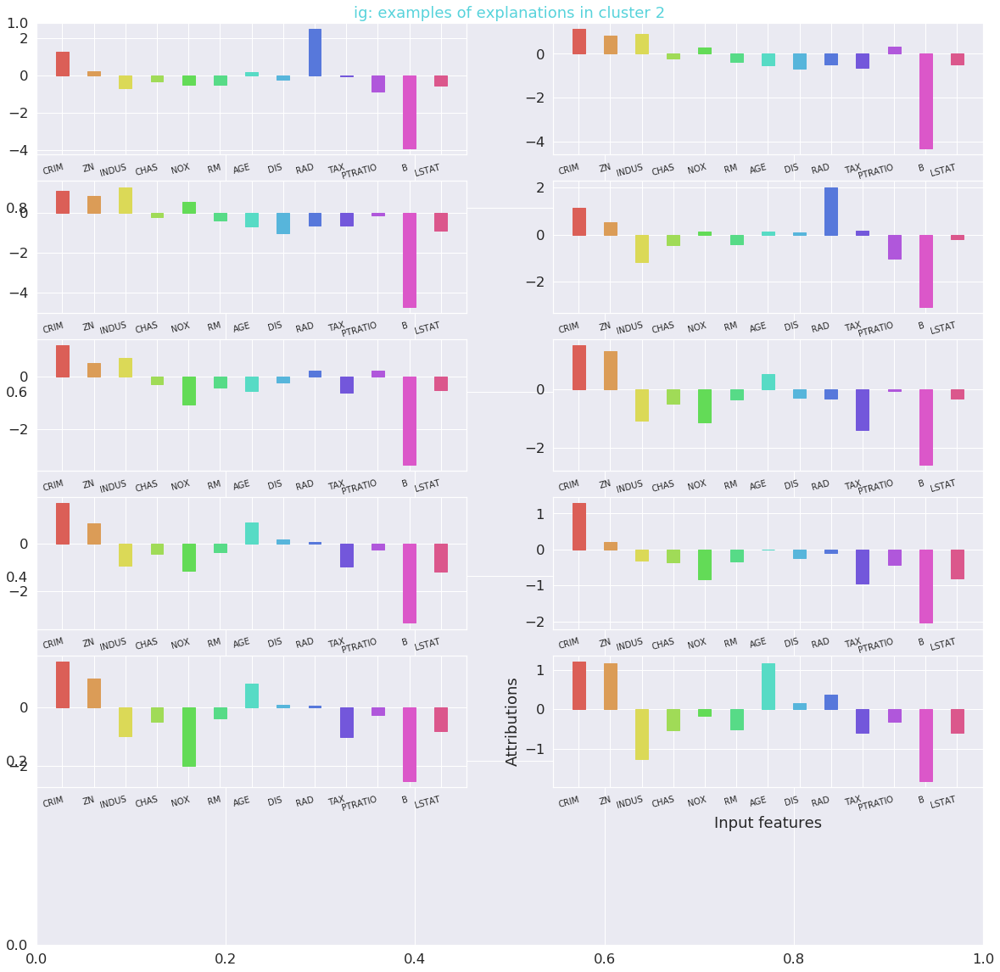

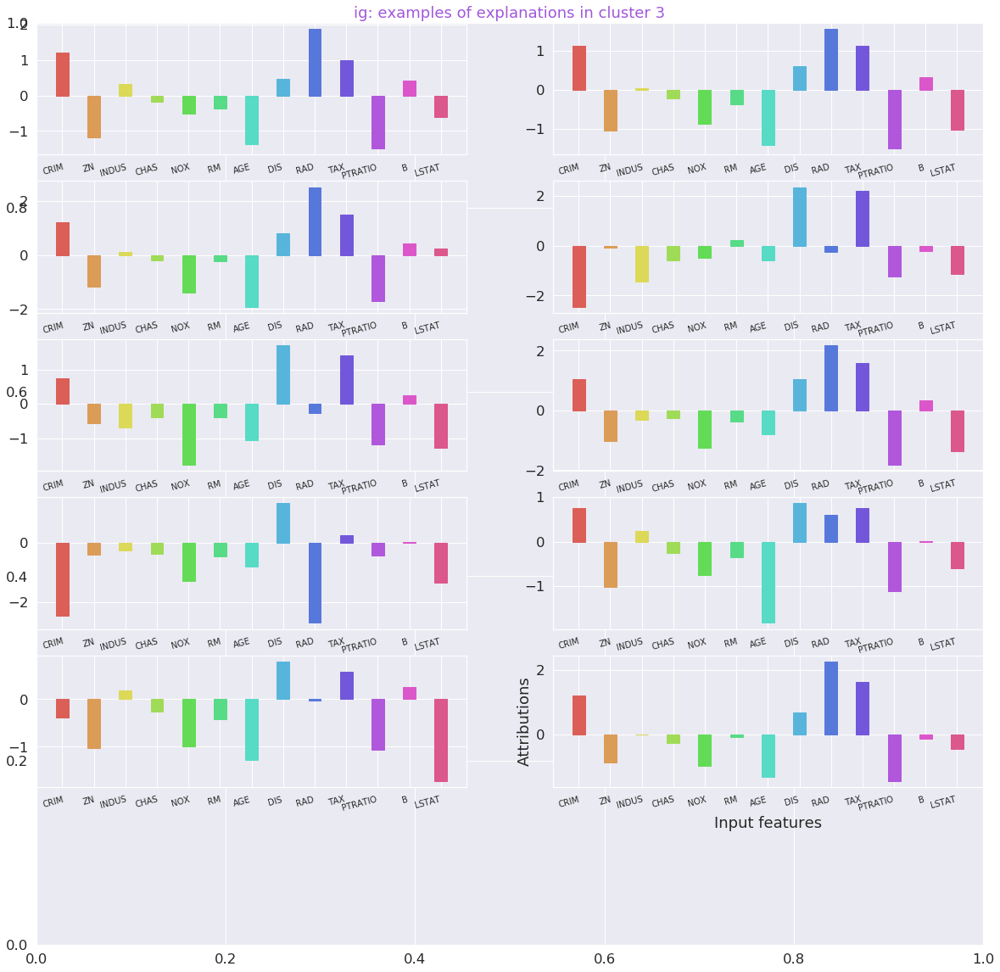

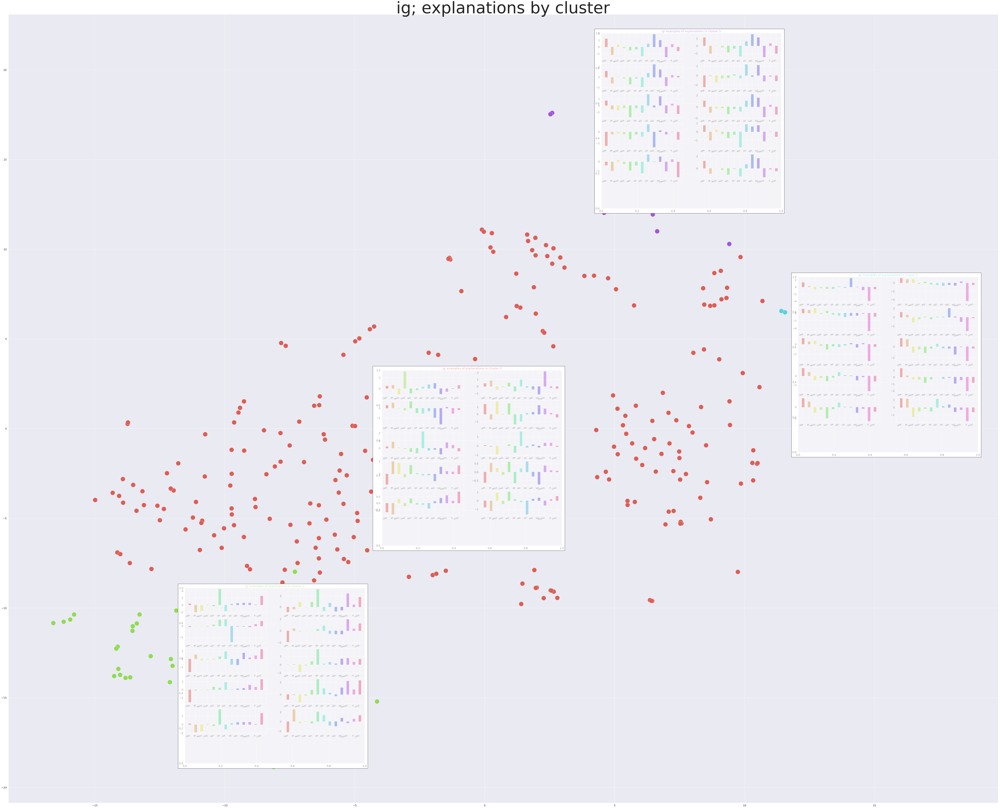

Imaginary values  [0.]


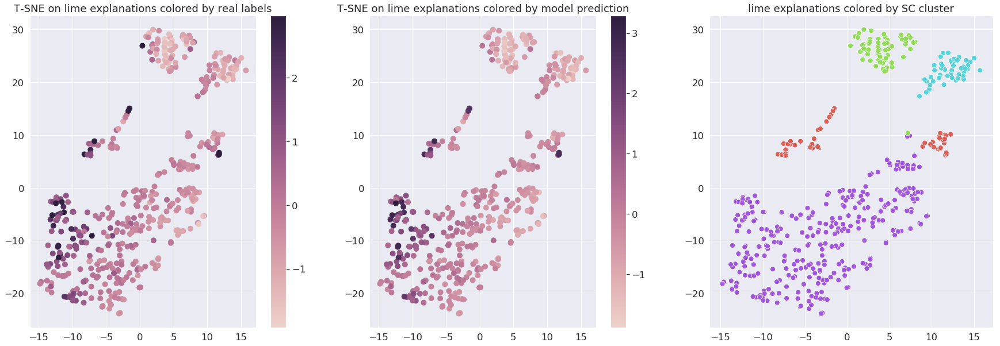

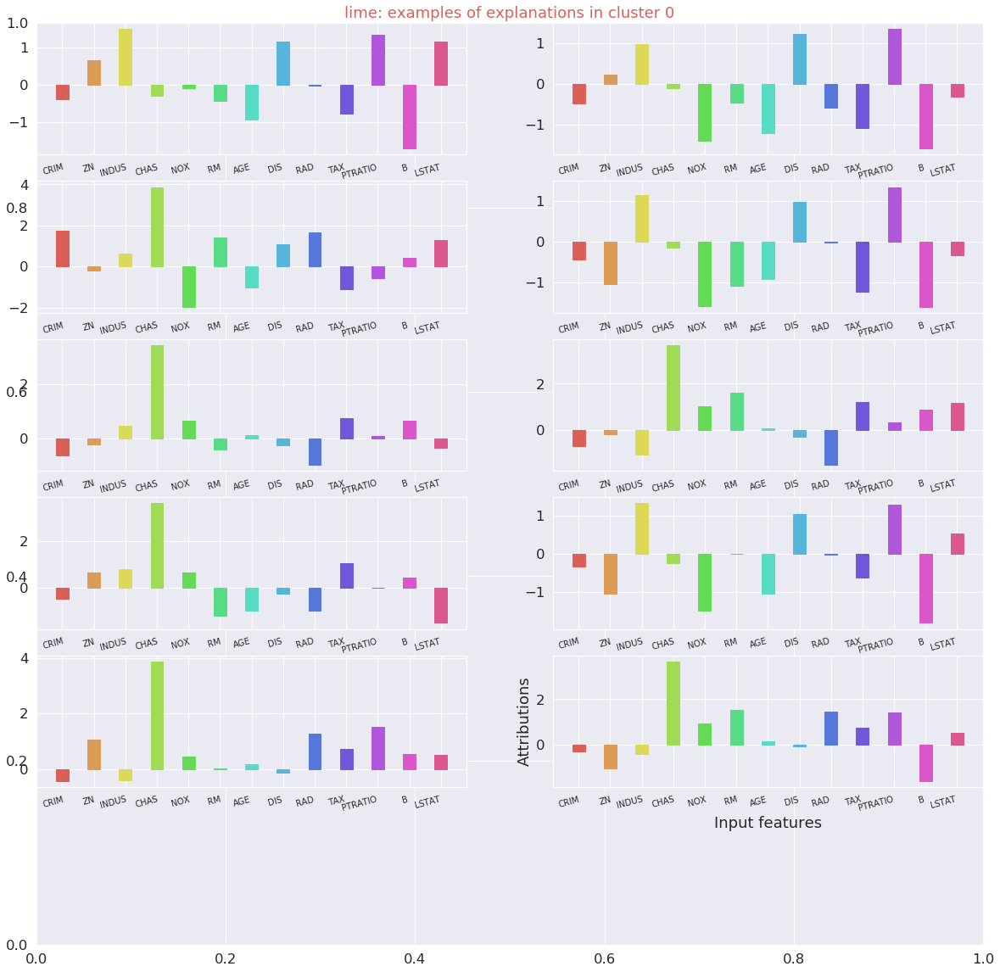

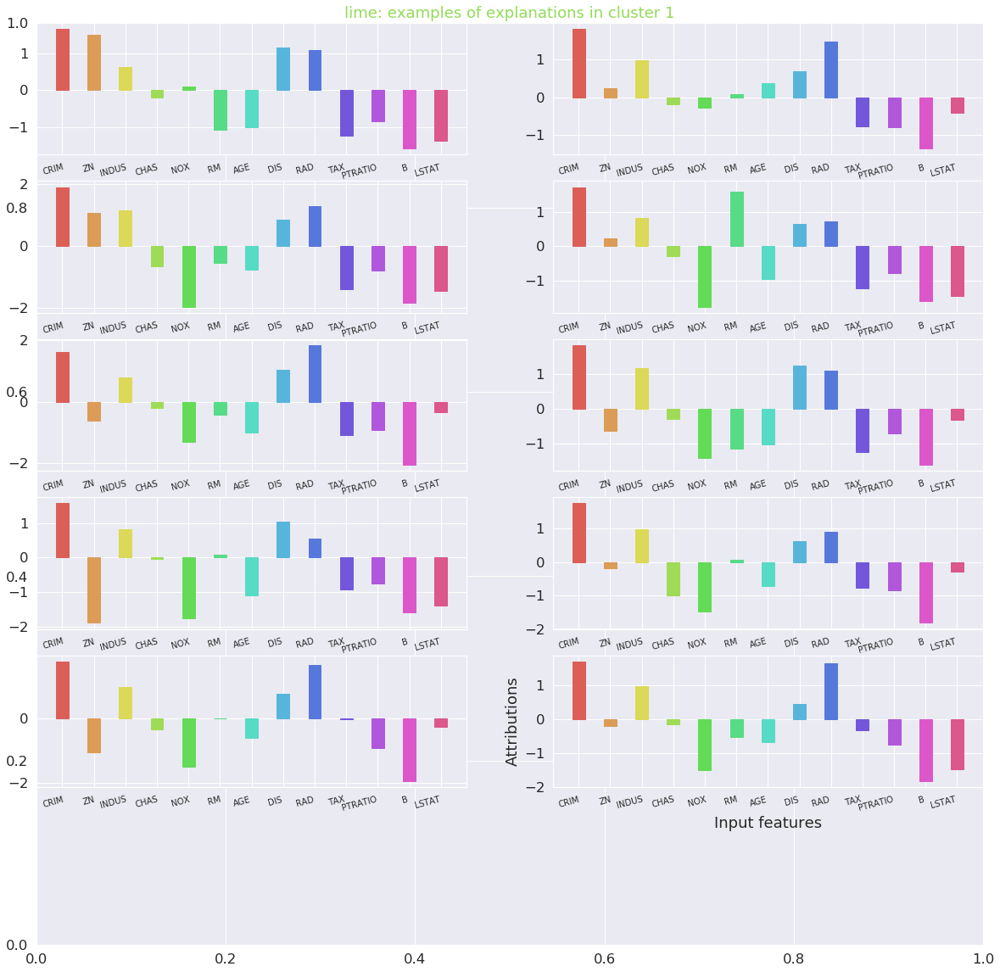

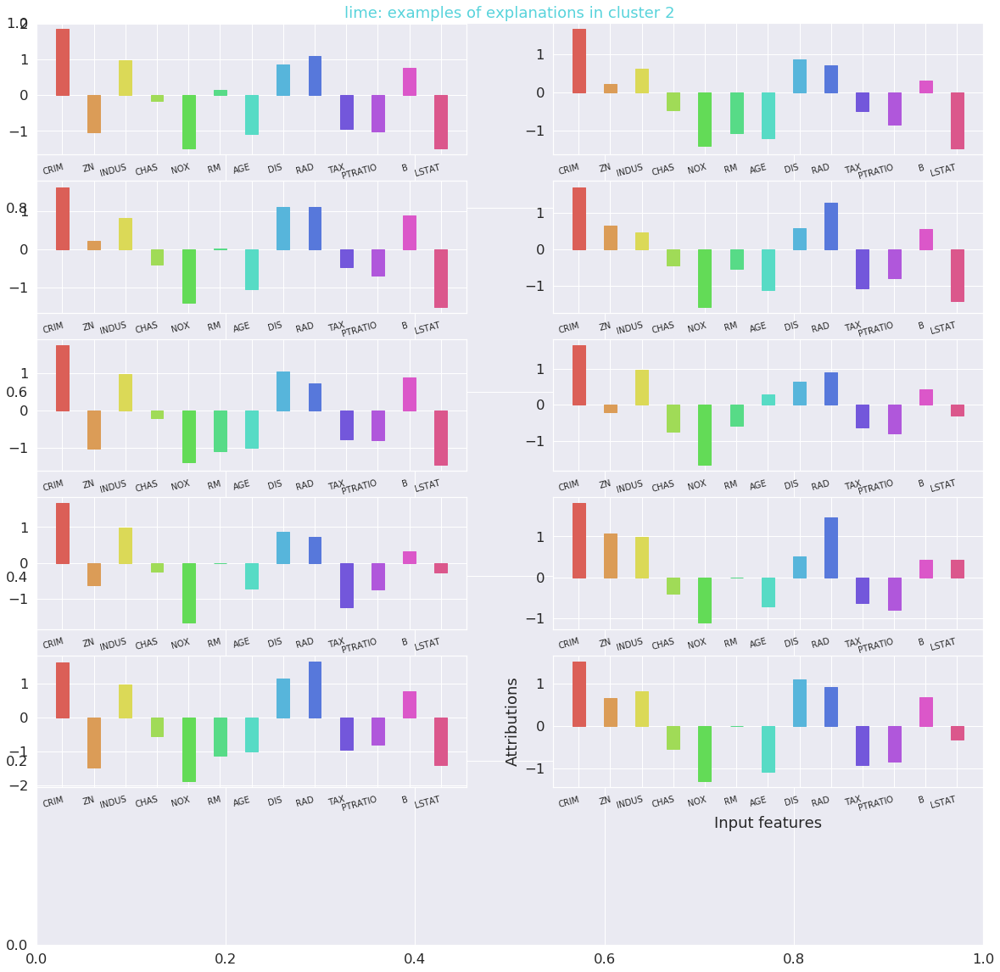

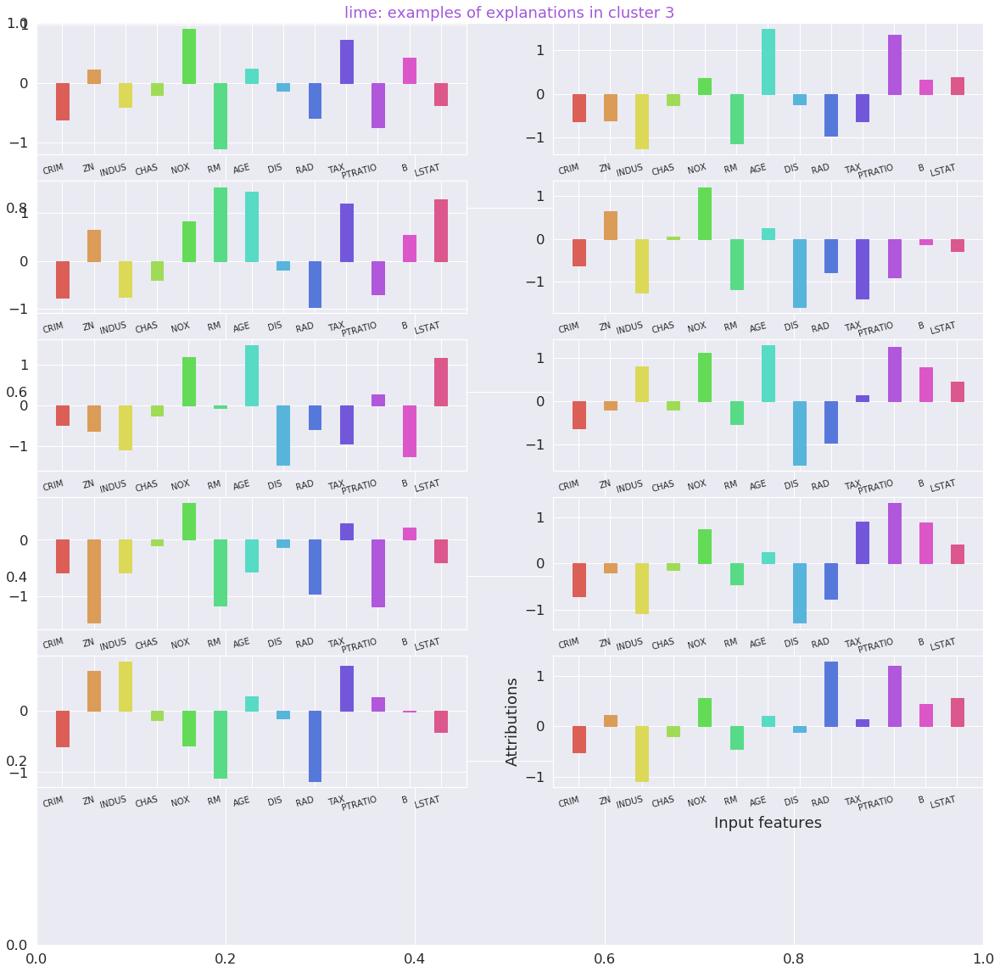

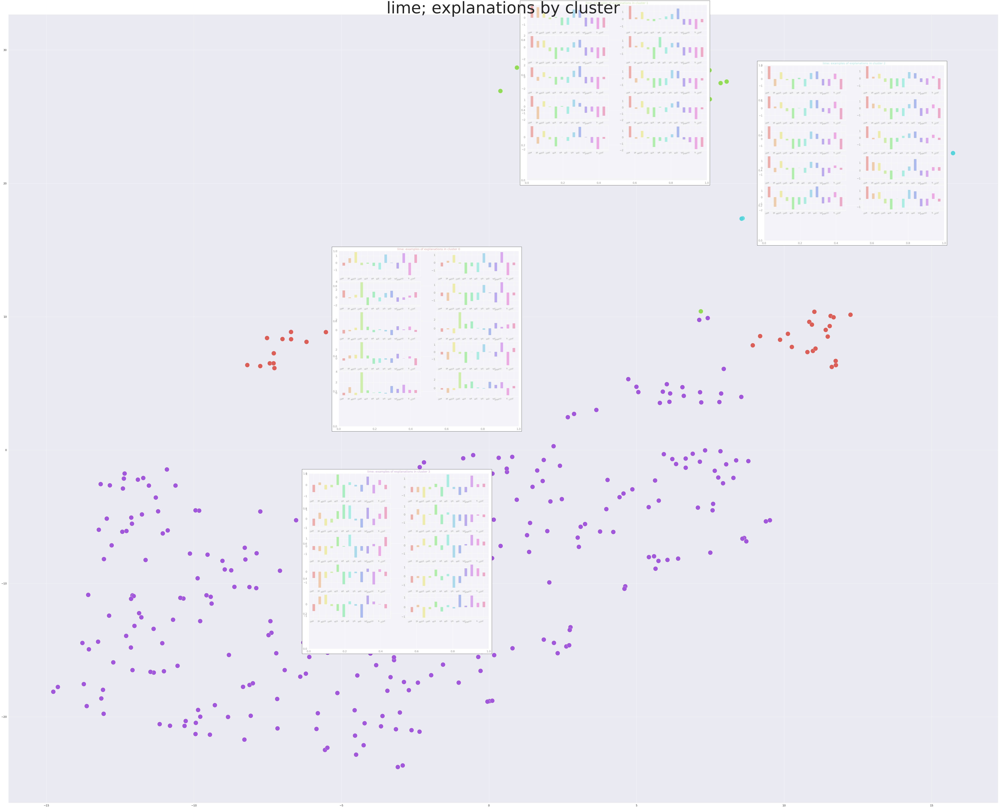

In [30]:
for method, (proy, mat, real_labels) in method_proy_attribution_labels.items():

    rows = 1
    cols = 3
    fig  = plt.figure(figsize = (30, 10))

    colors = real_labels
    add_continuous_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 1, fig,
                                    "T-SNE on "+str(method)+" explanations colored by real labels")

    colors = preds.reshape(-1,)
    add_continuous_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 2, fig,
                                    "T-SNE on "+str(method)+" explanations colored by model prediction")

    # Clustering
    n_clusters = method_class_perplexitys_clusters_dict[method][1]
    n_neighbors = method_class_nneighbors[method]
    clusters = clusters_by_spectral_clustering(mat, n_neighbors, n_clusters)

    # Clustering visualization
    colors = clusters_to_colors(clusters)
    add_colored_scatter_plot_to_fig(proy[:,0], proy[:,1], colors, rows, columns, 3, fig,
                                    method+" explanations colored by SC cluster")

    explanation_filenames = visualize_some_explanations_by_cluster(method, mat, clusters)

    cluster_medians = medians_in_projected_clusters(proy, clusters)
    # explanations over scatter
    fig, ax = plt.subplots(figsize=(110, 90))
    ax.set_title(method+"; explanations by cluster", fontsize=100)
    sns.scatterplot(proy[:,0], proy[:,1], c=colors, s=800, ax=ax)

    # ax.title("PCA predicted labels")
    for n_im, expl_filename in enumerate(explanation_filenames):
        img = Image.open(expl_filename)
        img.putalpha(127)  # Half alpha; alpha argument must be an int
        img.save("t_"+expl_filename)
        arr = mpl.pyplot.imread("t_"+expl_filename)
        im = OffsetImage(arr, zoom=1)
        im.image.axes = ax
        ab = AnnotationBbox(im, cluster_medians[n_im])
        ax.add_artist(ab)
        plt.draw()
    plt.show()